# Install Requirements for AWS SageMaker

In [1]:
pip install gdown

Note: you may need to restart the kernel to use updated packages.


In [1]:
!pip install ipython-autotime
%load_ext autotime

time: 424 µs (started: 2021-12-05 12:03:12 +00:00)


In [3]:
pip install gensim

Note: you may need to restart the kernel to use updated packages.
time: 1.32 s (started: 2021-12-04 23:17:18 +00:00)


In [4]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.
time: 1.61 s (started: 2021-12-04 23:17:20 +00:00)


In [5]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.
time: 1.57 s (started: 2021-12-04 23:17:21 +00:00)


In [6]:
pip install torch torchvision torchaudio

Note: you may need to restart the kernel to use updated packages.
time: 1.22 s (started: 2021-12-04 23:17:23 +00:00)


In [7]:
pip install tables

Note: you may need to restart the kernel to use updated packages.
time: 1.28 s (started: 2021-12-04 23:17:24 +00:00)


In [8]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.
time: 1.38 s (started: 2021-12-04 23:17:26 +00:00)


# Loading Models

In [9]:
# Do not execute if loading the embeddings from drive
! wget -c "https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz"
! gdown 'https://drive.google.com/uc?id=15qqiiENEWU6UuhKb4k1JDiPKsW4GJAaw'

--2021-12-04 23:17:38--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.1.102
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.1.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: 'GoogleNews-vectors-negative300.bin.gz'

               Goog  38%[======>             ] 603.61M  78.0MB/s    eta 19s    ^C
Downloading...
From: https://drive.google.com/uc?id=15qqiiENEWU6UuhKb4k1JDiPKsW4GJAaw
To: /home/studio-lab-user/project/glove.6B.300d.word2vec
 14%|█████▎                                 | 143M/1.04G [00:02<00:10, 89.3MB/s]^C
Traceback (most recent call last):
  File "/home/studio-lab-user/.conda/envs/default/bin/gdown", line 8, in <module>
    sys.exit(main())
  File "/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/gdown/cli.py", line 145, in main
    filename = download(
  File "/home/studio-l

# Load Utils and data

In [10]:
! gdown 'https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD'

Downloading...
From: https://drive.google.com/uc?id=1zTDcgnFtQWUeXgIce4O2Z2OPn0vJH1aD
To: /home/studio-lab-user/project/utils_py.py
100%|██████████████████████████████████████| 6.69k/6.69k [00:00<00:00, 9.43MB/s]
time: 1.86 s (started: 2021-12-04 23:19:49 +00:00)


In [11]:
pip install transformers

Note: you may need to restart the kernel to use updated packages.
time: 1.53 s (started: 2021-12-04 23:19:51 +00:00)


In [2]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install ipython-autotime
%load_ext autotime

time: 374 µs (started: 2021-12-05 13:16:18 +00:00)


In [4]:
! gdown "https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM"
! gdown "https://drive.google.com/uc?id=1hZmVoYIyrY_oIFYe_zA3oPFkttom8Kc1"
! gdown "https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T"

Downloading...
From: https://drive.google.com/uc?id=1PSjnBVZM_hmM0jtQrZ7QNuzTeWDTPuHM
To: /home/studio-lab-user/project/bbc.csv
100%|██████████████████████████████████████| 5.10M/5.10M [00:00<00:00, 34.2MB/s]
Downloading...
From: https://drive.google.com/uc?id=1hZmVoYIyrY_oIFYe_zA3oPFkttom8Kc1
To: /home/studio-lab-user/project/classic3.csv
100%|██████████████████████████████████████| 3.84M/3.84M [00:00<00:00, 44.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1vKduM6oCoGWWiXZrn1P33rnu74YbJJ2T
To: /home/studio-lab-user/project/classic4.csv
100%|██████████████████████████████████████| 5.02M/5.02M [00:00<00:00, 31.0MB/s]
time: 10.6 s (started: 2021-12-05 11:57:01 +00:00)


In [3]:
from gensim.models import KeyedVectors
import pandas as pd
import numpy as np
import warnings
import re

from utils_py import static_document_embeddings, tokenize_re

time: 4.24 s (started: 2021-12-05 13:16:21 +00:00)


In [4]:
df = pd.read_csv("./classic4.csv")
df
texts = df['text'].values
classic4_labels = df["label"].values
k_classic4 = len(df['label'].unique())
print(k_classic4)
df.info()

4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7095 entries, 0 to 7094
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  7095 non-null   int64 
 1   text        7095 non-null   object
 2   label       7095 non-null   object
dtypes: int64(1), object(2)
memory usage: 166.4+ KB
time: 83.9 ms (started: 2021-12-05 13:16:25 +00:00)


In [5]:
df_bbc = pd.read_csv("./bbc.csv")
df_bbc
texts_bbc = df_bbc['text'].values
bbc_labels = df_bbc["label"].values
k_bbc = len(df['label'].unique())
print(k_bbc)
df_bbc.info()

4
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2225 entries, 0 to 2224
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  2225 non-null   int64 
 1   text        2225 non-null   object
 2   label       2225 non-null   object
dtypes: int64(1), object(2)
memory usage: 52.3+ KB
time: 76.7 ms (started: 2021-12-05 13:16:25 +00:00)


# Embeddings

## Load from Drive to save RAM and time

Read the embeddings saved before on Google Drive

### word2vec

In [8]:
! gdown "https://drive.google.com/uc?id=1270jrqfjC_j9jbujB8n6bTovnqCBG1Xp"
! gdown "https://drive.google.com/uc?id=1--FNn99G1Uut0R1v6mFqiuBi_pG-jC6o"

Downloading...
From: https://drive.google.com/uc?id=1270jrqfjC_j9jbujB8n6bTovnqCBG1Xp
To: /home/studio-lab-user/project/classic4_word2vec.h5
100%|███████████████████████████████████████| 17.1M/17.1M [00:00<00:00, 102MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--FNn99G1Uut0R1v6mFqiuBi_pG-jC6o
To: /home/studio-lab-user/project/bbc_word2vec.h5
100%|██████████████████████████████████████| 2.70M/2.70M [00:00<00:00, 20.5MB/s]
time: 8.1 s (started: 2021-12-05 11:57:16 +00:00)


In [6]:
classic4_word2vec = pd.read_hdf("classic4_word2vec.h5").to_numpy()
bbc_word2vec = pd.read_hdf("bbc_word2vec.h5").to_numpy()

time: 322 ms (started: 2021-12-05 13:16:26 +00:00)


### glove

In [10]:
! gdown "https://drive.google.com/uc?id=1-04KQb6ykGW20yXI8dSZk5YJQKT2CRGh"
! gdown "https://drive.google.com/uc?id=1-0eXYefFHTliAuFfrRX8g2gnkYlF3Z5H"

Downloading...
From: https://drive.google.com/uc?id=1-04KQb6ykGW20yXI8dSZk5YJQKT2CRGh
To: /home/studio-lab-user/project/bbc_glove.h5
100%|██████████████████████████████████████| 2.70M/2.70M [00:00<00:00, 20.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0eXYefFHTliAuFfrRX8g2gnkYlF3Z5H
To: /home/studio-lab-user/project/classic4_glove.h5
100%|██████████████████████████████████████| 17.1M/17.1M [00:00<00:00, 54.0MB/s]
time: 10 s (started: 2021-12-05 11:57:24 +00:00)


In [7]:
classic4_glove = pd.read_hdf("classic4_glove.h5").to_numpy()
bbc_glove = pd.read_hdf("bbc_glove.h5").to_numpy()

time: 103 ms (started: 2021-12-05 13:16:28 +00:00)


## Word2Vec

In [ ]:
word2vec_model = KeyedVectors.load_word2vec_format("./GoogleNews-vectors-negative300.bin.gz", binary=True)

In [ ]:
get_word2vec_vector = lambda x: word2vec_model[x] if x in word2vec_model.vocab else None

In [ ]:
classic4_word2vec = static_document_embeddings(get_word2vec_vector, texts, tokenize_re)

In [ ]:
classic4_word2vec.shape

In [ ]:
bbc_word2vec = static_document_embeddings(get_word2vec_vector, texts_bbc, tokenize_re)

In [ ]:
bbc_word2vec.shape

#### Save Embeddings in HDF5

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

KeyboardInterrupt: ignored

In [ ]:
pd.DataFrame(classic4_word2vec).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_word2vec.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_word2vec).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_word2vec.h5', key='df', mode='w')

## Glove

In [ ]:
!wget -c "https://nlp.stanford.edu/data/glove.840B.300d.zip"

In [ ]:
! unzip glove.840B.300d.zip

In [ ]:
from gensim.test.utils import datapath, get_tmpfile
from gensim.scripts.glove2word2vec import glove2word2vec

glove_file = 'glove.840B.300d.txt'

In [ ]:
tmp_file = "./glove.840B.300d.word2vec"
_ = glove2word2vec(glove_file, tmp_file)
glove_model = KeyedVectors.load_word2vec_format(tmp_file, binary=False)

In [ ]:
!cp "./glove.840B.300d.word2vec" "./drive/MyDrive/MLDS/CoClust/glove.840B.300d.word2vec"

In [ ]:
# glove_model = KeyedVectors.load_word2vec_format("./glove.6B.300d.word2vec", binary=False)

In [ ]:
get_glove_vector = lambda x: glove_model[x] if x in glove_model.vocab else None

In [ ]:
classic4_glove = static_document_embeddings(get_glove_vector, texts, tokenize_re)

In [ ]:
classic4_glove.shape

In [ ]:
bbc_glove = static_document_embeddings(get_glove_vector, texts_bbc, tokenize_re)

In [ ]:
bbc_glove.shape

#### Save Embeddings in HDF5

In [ ]:
pd.DataFrame(classic4_glove).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_glove.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_glove).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_glove.h5', key='df', mode='w')

## Bert

In [ ]:
from utils_py import collate_fn, encode_sentences_batch

In [ ]:
from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer, AlbertTokenizer, AlbertModel

In [ ]:
from torch.utils.data import DataLoader

In [ ]:
import torch

In [ ]:
if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

In [ ]:
model_name = 'bert-base-cased'
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizer = BertTokenizer.from_pretrained(model_name)

In [ ]:
if device == 'cuda':
    model.cuda()

In [ ]:
classic4_bert = encode_sentences_batch(model, tokenizer, texts, batch_size=32)

In [ ]:
# concatenated embeddings
classic4_bert_concat = np.concatenate(classic4_bert, axis=1)
classic4_bert_concat.shape

In [ ]:
bbc_bert = encode_sentences_batch(model, tokenizer, texts_bbc, batch_size=32)

In [ ]:
# concatenated embeddings
bbc_bert_concat = np.concatenate(bbc_bert, axis=1)
bbc_bert_concat.shape

In [ ]:
pd.DataFrame(classic4_bert_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_bert.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_bert_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_bert.h5', key='df', mode='w')

## Roberta

In [ ]:
model_name = 'roberta-base'
modelRoberta = RobertaModel.from_pretrained(model_name, output_hidden_states=True)
tokenizerRoberta = RobertaTokenizer.from_pretrained(model_name)

In [ ]:
if device == 'cuda':
    modelRoberta.cuda()

In [ ]:
classic4_roberta = encode_sentences_batch(modelRoberta, tokenizerRoberta, texts, batch_size=32)

In [ ]:
# concatenated
classic4_roberta_concat = np.concatenate(classic4_roberta, axis=1)
classic4_roberta_concat.shape

In [ ]:
bbc_roberta = encode_sentences_batch(modelRoberta, tokenizerRoberta, texts_bbc, batch_size=32)

In [ ]:
# concatenated
bbc_roberta_concat = np.concatenate(bbc_roberta, axis=1)
bbc_roberta_concat.shape

In [ ]:
pd.DataFrame(classic4_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_roberta.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_roberta.h5', key='df', mode='w')

## Albert

In [ ]:
pip install sentencepiece

In [ ]:
model_name = 'albert-base-v2'
modelAlbert = AlbertModel.from_pretrained(model_name, output_hidden_states=True)
tokenizerAlbert = AlbertTokenizer.from_pretrained(model_name)

In [ ]:
if device == 'cuda':
    modelRoberta.cuda()

In [ ]:
classic4_albert = encode_sentences_batch(modelAlbert, tokenizerAlbert, texts, batch_size=32)

In [ ]:
# concatenated
classic4_roberta_concat = np.concatenate(classic4_roberta, axis=1)
classic4_roberta_concat.shape

In [ ]:
bbc_roberta = encode_sentences_batch(modelRoberta, tokenizerRoberta, texts_bbc, batch_size=32)

In [ ]:
# concatenated
bbc_roberta_concat = np.concatenate(bbc_roberta, axis=1)
bbc_roberta_concat.shape

In [ ]:
pd.DataFrame(classic4_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/classic4_roberta.h5', key='df', mode='w')

In [ ]:
pd.DataFrame(bbc_roberta_concat).to_hdf('./drive/MyDrive/MLDS/CoClust/bbc_roberta.h5', key='df', mode='w')

## Autoencoder

In [8]:
from torch.utils.data import DataLoader
import numpy as np
import torch
from tqdm import tqdm 

class AutoEncoder(torch.nn.Module):
    def __init__(self, input_dim, embedding_dim):
        super().__init__()
        self.input_dim = input_dim
        self.embedding_dim = embedding_dim

        self.encoder = torch.nn.Sequential(
            torch.nn.Linear(self.input_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.embedding_dim)
        )
        
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(self.embedding_dim, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, self.input_dim),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def autoencoder(X, embedding_dim, n_epochs=50, batch_size=64, learning_rate=1e-3, weight_decay=1e-8, seed=None, return_model=False):
    if torch.cuda.is_available():
        device = 'cuda'
    else:
        device = 'cpu'

    if seed is not None:
      torch.manual_seed(seed)

    dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)

    model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

    if device == 'cuda':
      model.cuda()

    loss_function = torch.nn.MSELoss()

    optimizer = torch.optim.Adam(model.parameters(),
                                lr=learning_rate,
                                weight_decay=weight_decay)

    losses = []

    model.train()
    for epoch in tqdm(range(n_epochs)):
        for batch in dataloader:
          batch = batch.to(device)
          reconstructed = model(batch)
          
          loss = loss_function(reconstructed, batch)
          
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          
          losses.append(loss)

    model.eval()
    tensor_X = torch.tensor(X)
    tensor_X = tensor_X.to(device)
    encoded_X = model.encoder(tensor_X)
    encoded_X = encoded_X.detach().cpu().numpy()

    if return_model:
      return encoded_X, model, losses
    else:
      return encoded_X

time: 1.96 ms (started: 2021-12-05 13:16:33 +00:00)


# Partie 1

In [21]:
pip install umap-learn

Note: you may need to restart the kernel to use updated packages.
time: 1.52 s (started: 2021-12-04 23:20:34 +00:00)


In [22]:
pip install hdbscan

Note: you may need to restart the kernel to use updated packages.
time: 1.44 s (started: 2021-12-04 23:20:35 +00:00)


In [9]:
import hdbscan

time: 241 ms (started: 2021-12-05 13:16:37 +00:00)


In [10]:
from sklearn.cluster import KMeans ,AgglomerativeClustering, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import numpy as np
from sklearn.metrics.cluster import normalized_mutual_info_score, adjusted_rand_score
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from umap import UMAP
from utils_py import accuracy


time: 6.19 s (started: 2021-12-05 13:16:37 +00:00)


In [11]:
def map_labels(labels):
    mapping = {}
    for (i,name) in enumerate(set(labels)):
        mapping[name] = i
    return [mapping[letter] for letter in labels]

time: 505 µs (started: 2021-12-05 13:16:43 +00:00)


In [12]:
def eval_clustering_2D(x, labels, pred_labels, methods):
    fig, axes = plt.subplots(int((len(pred_labels)+1)/3) if not (len(pred_labels)+1)%3 else int((len(pred_labels)+1)/3+1) , 3, figsize=(20,25))
    axes = [item for sublist in axes for item in sublist]
    axes[0].scatter(x[:,0], x[:,1],
                    c=labels, edgecolor='none', alpha=1,)
    axes[0].title.set_text('Real Labels')
    results = {}
    for i in range(len(pred_labels)):
        nmi = normalized_mutual_info_score(labels, pred_labels[i])
        ari = adjusted_rand_score(labels, pred_labels[i])
        acc = accuracy(labels, pred_labels[i])
        results[methods[i]] = (nmi,ari,acc)
        axes[i+1].scatter(x[:,0], x[:,1],
                    c=pred_labels[i], edgecolor='none', alpha=1,)
        axes[i+1].title.set_text(f'{methods[i]}\nNMI = {nmi}\nARI={ari}\nAcc={acc}')
    plt.show()
    return results
    

time: 3.94 ms (started: 2021-12-05 13:16:43 +00:00)


In [13]:
# def run_clustering(X, k, labels):
#     kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
#     spectral_labels = SpectralClustering(k, n_components= X.shape[1], assign_labels="discretize", random_state=42).fit(X).labels_
#     hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
#     cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
#     cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
#     cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
#     cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)

#     eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"])

time: 478 µs (started: 2021-12-05 13:16:43 +00:00)


In [14]:
def run_clustering(X, k, labels, spectral=False):
    kmeans_labels = KMeans(k, random_state=42).fit(X).labels_
    hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X).labels_
    cah_labels_ward = AgglomerativeClustering(n_clusters=k).fit_predict(X)
    cah_labels_complete = AgglomerativeClustering(n_clusters=k, linkage="complete").fit_predict(X)
    cah_labels_average = AgglomerativeClustering(n_clusters=k, linkage="average").fit_predict(X)
    cah_labels_single = AgglomerativeClustering(n_clusters=k, linkage="single").fit_predict(X)
    gaussian = GaussianMixture(n_components=k, random_state=42).fit_predict(X)
    
    if spectral:
        spectral_labels = SpectralClustering(k, assign_labels="discretize", random_state=42).fit(X).labels_
        return eval_clustering_2D(X, labels, [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

    else:
        return eval_clustering_2D(X, labels, [kmeans_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

time: 1.17 ms (started: 2021-12-05 13:16:43 +00:00)


In [15]:
methods = ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]
methods_noSpec = ["Kmeans", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)"]

time: 471 µs (started: 2021-12-05 13:16:43 +00:00)


## Classic4

In [24]:
results_classic4_redim = {}
results_classic4_glove_redim = {}

time: 404 µs (started: 2021-12-05 13:28:24 +00:00)


In [16]:
df.groupby("label").size()

label
cacm    3204
cisi    1460
cran    1398
med     1033
dtype: int64

time: 8.45 ms (started: 2021-12-05 12:04:35 +00:00)


Nous pouvons voir que les classes ne sont pas de la même taille, ce qui rend la mesure de la précision inappropriée pour l'évaluation des classificateurs.

### word2vec

#### Espace Original

In [17]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_word2vec)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_word2vec).labels_
spectral_labels = SpectralClustering(k_classic4, n_components= classic4_word2vec.shape[1], assign_labels="discretize", random_state=42).fit(classic4_word2vec).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_word2vec).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_word2vec)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_word2vec)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_word2vec)
gaussian = GaussianMixture(n_components=k_classic4, random_state=42).fit_predict(classic4_word2vec)

time: 3min 22s (started: 2021-12-05 12:04:35 +00:00)


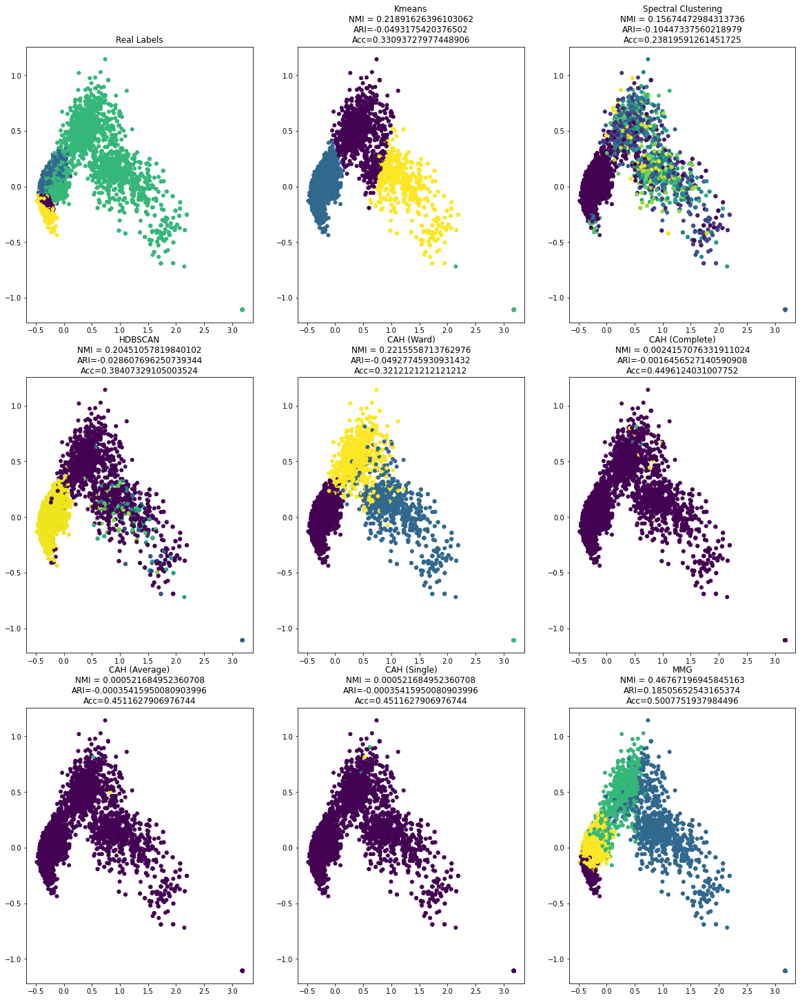

time: 1.52 s (started: 2021-12-05 12:07:58 +00:00)


In [18]:
results_classic4_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

En visualisant l'espace en utilisant l'ACP à 2 dimensions, nous pouvons voir que les classes sont difficiles à séparer. 

Les résultats ci-dessus montrent que les différentes méthodes de classification utilisées ne sont pas capables de séparer les classes dans leur espace d'origine, car la plupart d'entre elles sont proches de l'estimation aléatoire des étiquettes (ARI proche de 0 ou <0).
Il est intéressant de noter que le modèle MMG fait mieux que les autres modèles, mais qu'il n'apporte toujours pas d'amélioration significative par rapport aux autres modèles.

Nous pouvons également remarquer que la précision n'est pas la meilleure métrique pour évaluer la performance des classificateurs car la classe "cacm" a le plus d'individus, confirmant ainsi l'hypothèse que nous soupçonnions précédemment. 

Nous n'exécuterons pas le clustering spectral dans les expériences suivantes en raison de ses temps d'exécution élevés.

#### Espace Reduit

PCA avec 2 composantes

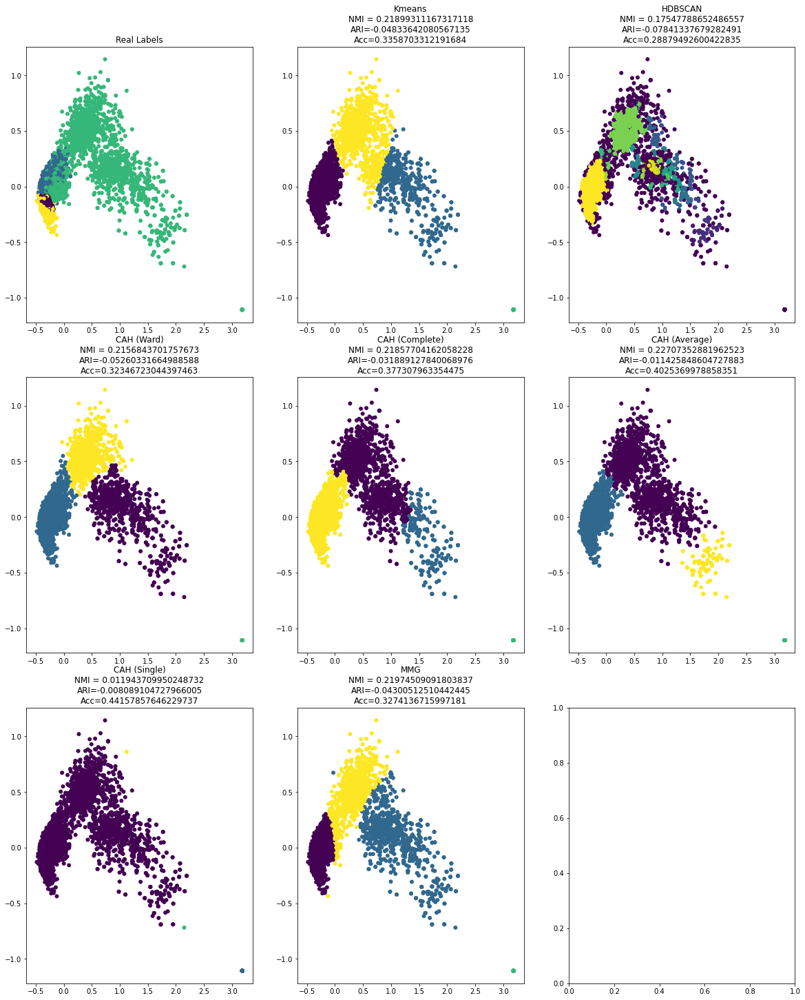

time: 7.76 s (started: 2021-12-05 12:07:59 +00:00)


In [19]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_word2vec)
results_classic4_redim['pca2'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

PCA avec 20 composantes

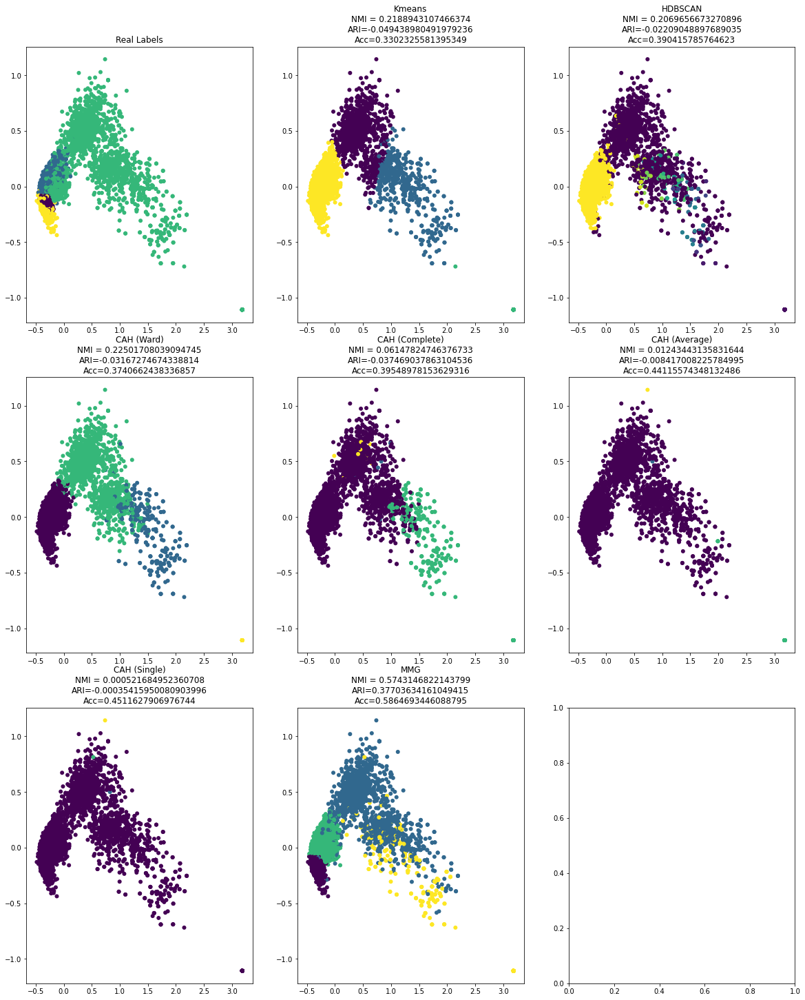

time: 11.4 s (started: 2021-12-05 12:08:07 +00:00)


In [20]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(classic4_word2vec)
results_classic4_redim['pca20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- Nous pouvons voir que l'utilisation d'une ACP à 2 ou 20 composantes n'aide pas à améliorer les performances des classifieurs utilisés puisque l'espace dans lequel nous projetons les données n'est pas bon pour séparer les différents classifications.

- Tout comme dans l'espace original, le MMG fait mieux que les autres classificateurs.

- Passer de 2 à 20 composantes n'améliore pas la performance des classificateurs sauf pour le MMG qui améliore significativement l'ARI et le NMI.

TSNE

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


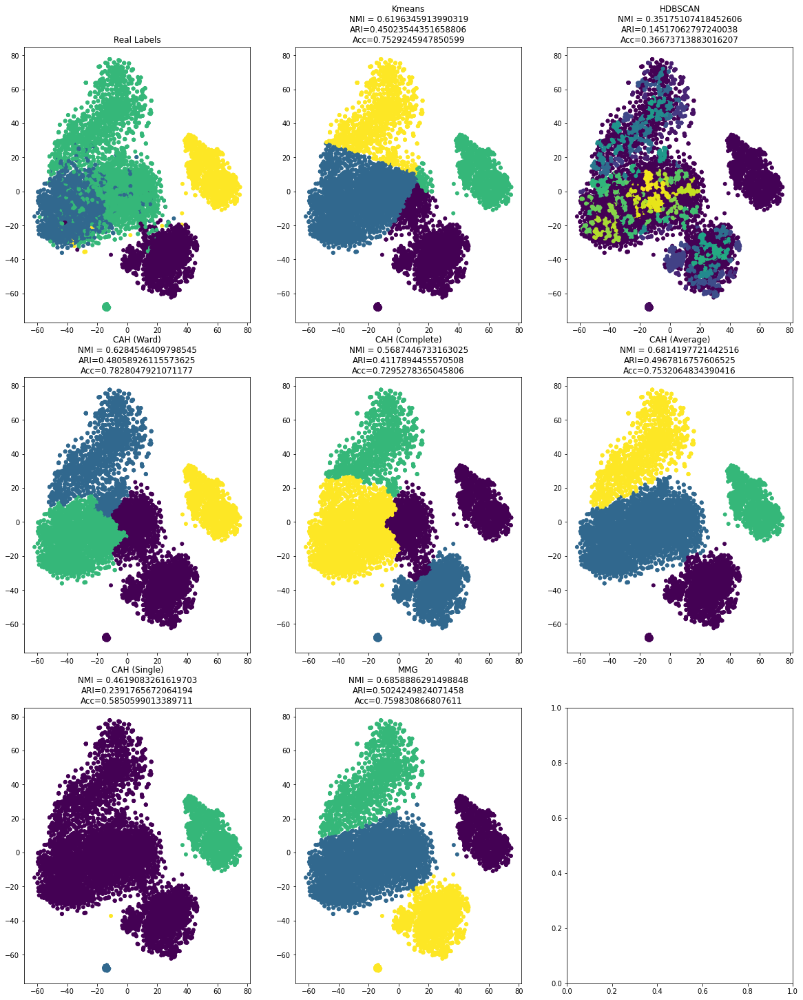

time: 49.9 s (started: 2021-12-05 12:08:19 +00:00)


In [21]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_word2vec)
results_classic4_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic4, map_labels(classic4_labels))

- L'espace issu de l'application de tSNE aux données a amélioré de manière significative les performances de tous les modèles.
- La différence de performance entre les projections PCA et tSNE varie entre les différents modèles.
    - L'espace issu de l'application de tSNE aux données a amélioré de manière significative la performance du modèle Kmeans ; nous pouvons voir que le NMI est passé de 0,2 à 0,6 et l'ARI d'une valeur négative à 0,45, ce qui est une valeur acceptable.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle HDBSCAN, mais pas de manière aussi significative que le modèle Kmeans. L'ARI est toujours proche de 0, ce qui signifie que le modèle est toujours comme s'il devinait les étiquettes.
    - Les CAH avec les différentes méthodes de linkage se sont tous améliorés sauf pour le linkage minimal, l'ARI pour ces modèles varie entre 0.41 et 0.49 ce qui est une valeur acceptable avec un NMI entre 0.56 et 0.68. Le modèle CAH avec lien moyen est le plus performant des modèles CAH et bat même les résultats obtenus avec Kmeans.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle MMG qui passe de 0,3 ARI en ACP à 0,5 et de 0,57 NMI à 0,68.

- La précision pour Kmeans, CAH et MMG est la même (75%). Si nous utilisons le NMI pour comparer les modèles, nous pouvons voir que le modèle MMG est toujours le modèle le plus performant, mais par une petite marge.   


UMAP

In [22]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_word2vec)

time: 22 s (started: 2021-12-05 12:09:08 +00:00)


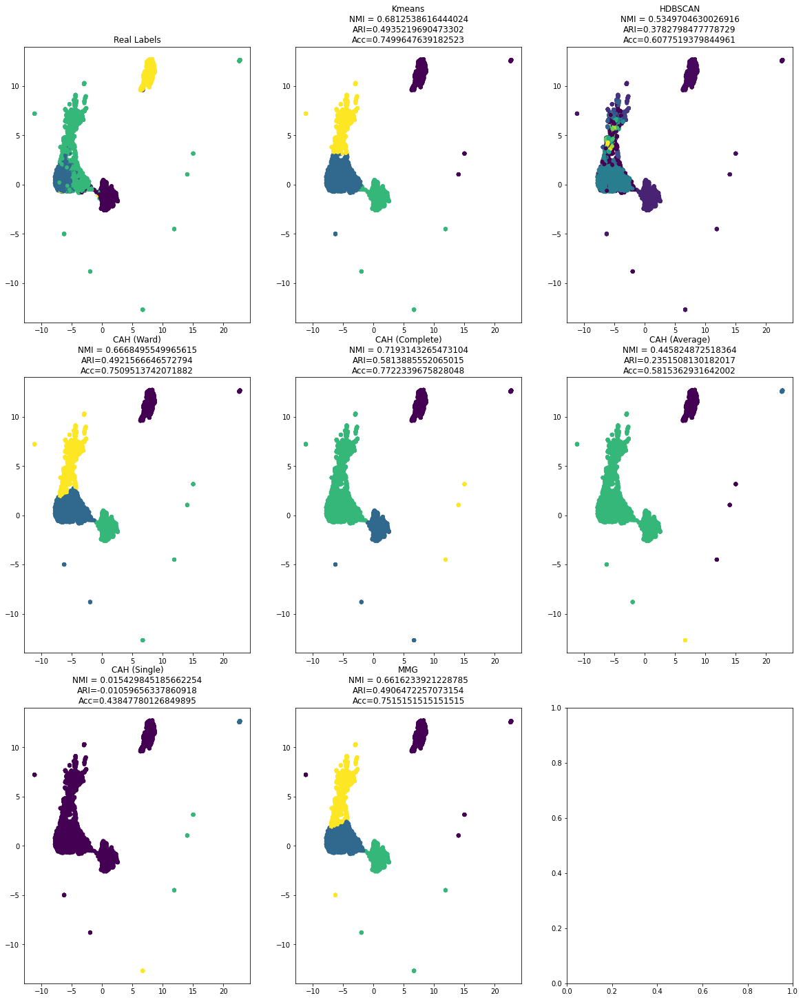

time: 6.5 s (started: 2021-12-05 12:09:30 +00:00)


In [23]:
results_classic4_redim['umap'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

In [55]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(classic4_word2vec)

time: 25.3 s (started: 2021-12-05 12:35:57 +00:00)


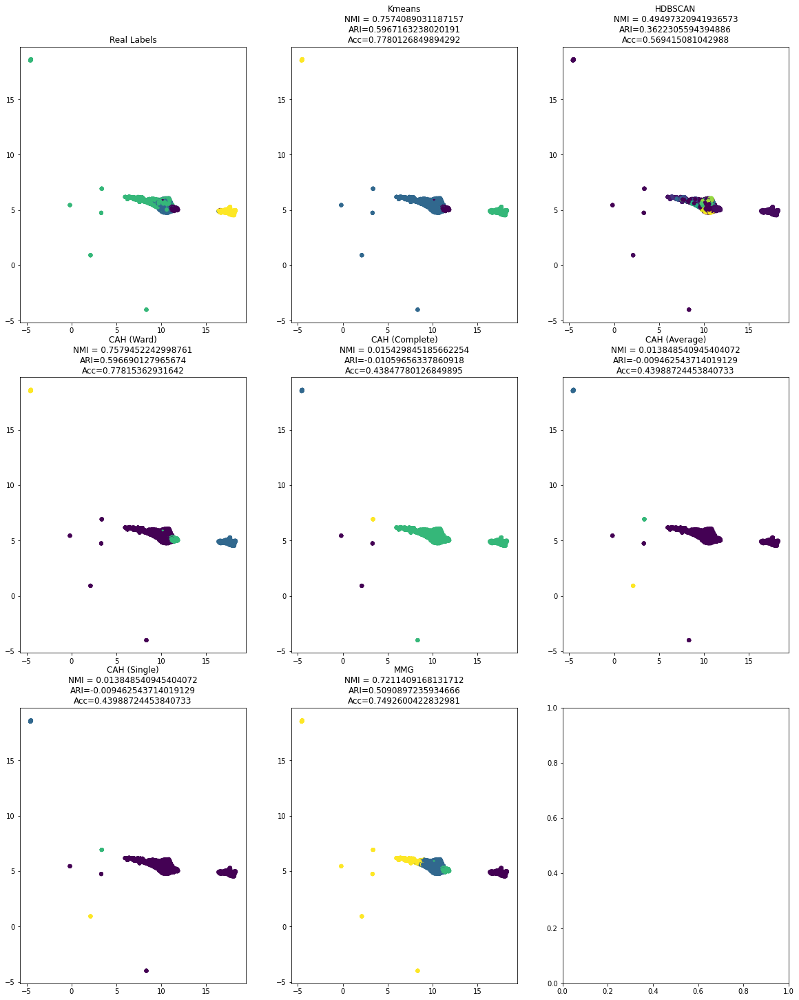

time: 8.01 s (started: 2021-12-05 12:36:22 +00:00)


In [56]:
results_classic4_redim['umap20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- L'espace issu de l'application de l'UMAP aux données a considérablement amélioré les performances de tous les modèles de l'espace original.

    - Kmeans sous UMAP est meilleur que l'espace original et que tSNE, surtout lorsqu'un nombre plus élevé de composantes est utilisé ; il prend la tête des performances avec le NMI et l'ARI les plus élevés ainsi qu'une précision de 77%.
    - Nous pouvons constater que la méthode de liaison a un impact important sur les performances du modèle CAH. La mesure de distance doit être choisie avec soin en fonction de l'espace des données. Sous 2 composants, le lien maximum est le meilleur CAH, mais sous 20 composants, il est nettement meilleur et ses performances sont très proches de celles de Kmeans.
    - Le modèle MMG est toujours meilleur avec plus d'informations, ce qui explique l'augmentation de la performance entre 2 et 20 composantes, mais cette fois-ci, il est moins performant que Kmeans et CAH (Ward). 

Autoencoder

In [58]:
n_components=2
X_reduced = autoencoder(classic4_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:13<00:00,  3.65it/s]

time: 13.8 s (started: 2021-12-05 12:38:21 +00:00)


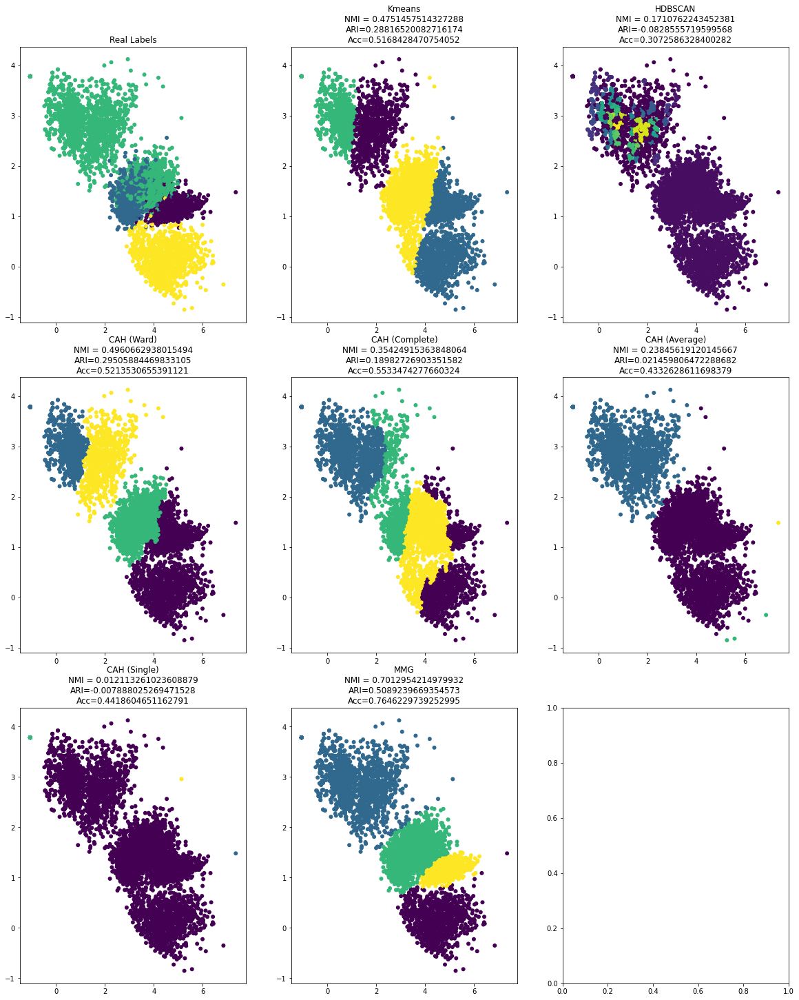

time: 6.27 s (started: 2021-12-05 12:38:35 +00:00)


In [59]:
results_classic4_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- Nous avons testé différentes architectures pour l'autoencodeur :
    - Si nous ajoutons une couche, le modèle n'apprendra rien, nous soupçonnons le problème du gradient de fuite avec les petits ensembles de données que nous avons.
    - si nous augmentons la taille de la couche cachée, le modèle aura du mal à apprendre aussi, nous avons fait quelques expériences avec la taille de la couche cachée et avons décidé d'aller avec 256.

- D'après les résultats de l'application des différentes méthodes de classification sur l'espace issu de l'autoencodeur, nous pouvons voir :
    - Tous les modèles font mieux que sous l'espace original et l'ACP mais n'atteignent pas leurs performances sous tSNE et UMAP.
    - MMG a obtenu sa meilleure performance sous l'espace d'autoencodage avec un NMI de 0.7 et un ARI de 0.5 avec une précision de 76%.

#### Interpretations des resultats 

In [60]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.06 ms (started: 2021-12-05 12:38:41 +00:00)


In [61]:
results_word2vec_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 2.91 ms (started: 2021-12-05 12:38:41 +00:00)


Tableau des metriques

In [62]:
results_word2vec_classic4

nmi       ari       acc
original    Kmeans               0.218916 -0.049318  0.330937
            Spectral Clustering  0.156745 -0.104473  0.238196
            HDBSCAN              0.204511 -0.028608  0.384073
            CAH (Ward)           0.221556 -0.049277  0.321212
            CAH (Complete)       0.002416 -0.001646  0.449612
            CAH (Average)        0.000522 -0.000354  0.451163
            CAH (Single)         0.000522 -0.000354  0.451163
            MMG                  0.467672  0.185057  0.500775
pca2        Kmeans               0.218993 -0.048336  0.335870
            HDBSCAN              0.175478 -0.078413  0.288795
            CAH (Ward)           0.215684 -0.052603  0.323467
            CAH (Complete)       0.218577 -0.031889  0.377308
            CAH (Average)        0.227074 -0.011426  0.402537
            CAH (Single)         0.011944 -0.008089  0.441579
            MMG                  0.219745 -0.043005  0.327414
pca20       Kmeans               0.218894 -0.049439  0.330233
            HDBSCAN              0.206966 -0.022090  0.390416
            CAH (Ward)           0.225017 -0.031673  0.374066
            CAH (Complete)       0.061478 -0.037469  0.395490
            CAH (Average)        0.012434 -0.008417  0.441156
            CAH (Single)         0.000522 -0.000354  0.451163
            MMG                  0.574315  0.377036  0.586469
tsne        Kmeans               0.619635  0.450235  0.752925
            HDBSCAN              0.351751  0.145171  0.366737
            CAH (Ward)           0.628455  0.480589  0.782805
            CAH (Complete)       0.568745  0.411789  0.729528
            CAH (Average)        0.681420  0.496782  0.753206
            CAH (Single)         0.461908  0.239177  0.585060
            MMG                  0.685889  0.502425  0.759831
umap        Kmeans               0.681254  0.493522  0.749965
            HDBSCAN              0.534970  0.378280  0.607752
            CAH (Ward)           0.666850  0.492157  0.750951
            CAH (Complete)       0.719314  0.581389  0.772234
            CAH (Average)        0.445825  0.235151  0.581536
            CAH (Single)         0.015430 -0.010597  0.438478
            MMG                  0.661623  0.490647  0.751515
autoencoder Kmeans               0.475146  0.288165  0.516843
            HDBSCAN              0.171076 -0.082856  0.307259
            CAH (Ward)           0.496066  0.295059  0.521353
            CAH (Complete)       0.354249  0.189827  0.553347
            CAH (Average)        0.238456  0.021460  0.433263
            CAH (Single)         0.012113 -0.007888  0.441860
            MMG                  0.701295  0.508924  0.764623
umap20      Kmeans               0.757409  0.596716  0.778013
            HDBSCAN              0.494973  0.362231  0.569415
            CAH (Ward)           0.757945  0.596690  0.778154
            CAH (Complete)       0.015430 -0.010597  0.438478
            CAH (Average)        0.013849 -0.009463  0.439887
            CAH (Single)         0.013849 -0.009463  0.439887
            MMG                  0.721141  0.509090  0.749260

time: 11.2 ms (started: 2021-12-05 12:38:41 +00:00)


Les meilleurs methodes selon les 3 metriques

In [63]:
metric = "ari"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
umap20,Kmeans,0.757409,0.596716,0.778013


time: 6.72 ms (started: 2021-12-05 12:38:41 +00:00)


In [64]:
metric = "nmi"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
umap20,CAH (Ward),0.757945,0.59669,0.778154


time: 6.56 ms (started: 2021-12-05 12:38:41 +00:00)


In [65]:
metric = "acc"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Ward),0.628455,0.480589,0.782805


time: 6.87 ms (started: 2021-12-05 12:38:41 +00:00)


Le meilleur compromi c'est le CAH (Ward) avec UMAP de 20 composantes

In [17]:
X_reduced_tsne = UMAP(n_components=20, random_state=42).fit_transform(classic4_word2vec)
best_labels = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(X_reduced_tsne)

time: 27.7 s (started: 2021-12-05 13:17:55 +00:00)


In [18]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 37.9 ms (started: 2021-12-05 13:18:22 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 0


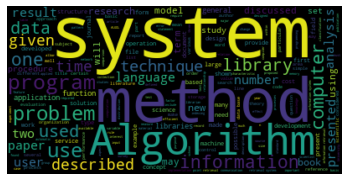



Class: 1


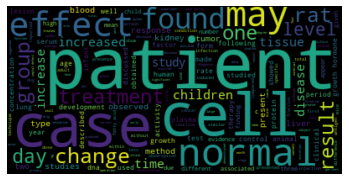



Class: 2


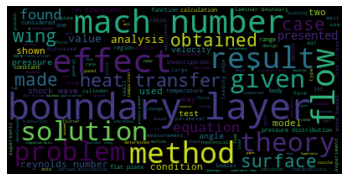



Class: 3


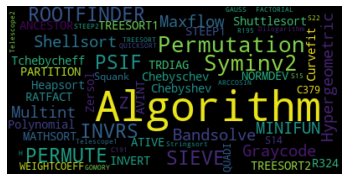



time: 3.73 s (started: 2021-12-05 13:18:22 +00:00)


In [19]:
print_wordcloud(df['text'].values, best_labels)

Class: cacm


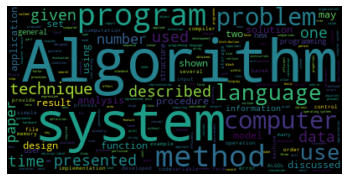



Class: cisi


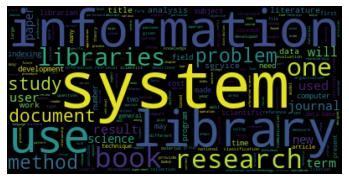



Class: med


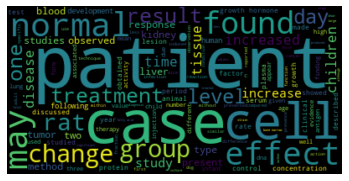



Class: cran


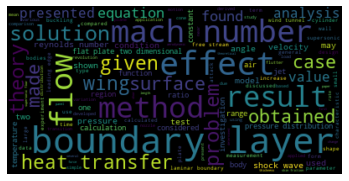



time: 3.73 s (started: 2021-12-05 13:18:26 +00:00)


In [20]:
print_wordcloud(df['text'].values, df['label'].values)

En visualisant les nuages de mots et en les comparant, nous pouvons voir que les classes prédites sont les suivantes :
- La classe 0 est approximativement la classe "cacm" car nous pouvons voir que ce sont les mêmes termes les plus fréquents dans les deux classes.
- La classe 1 correspond approximativement à la classe "med", car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 2 est approximativement la classe "cran" car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 3 est approximativement la classe "cisi" car on peut voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.

### GloVe

#### Espace Original

In [22]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_glove)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_glove).labels_
spectral_labels = SpectralClustering(k_classic4, n_components= classic4_glove.shape[1], assign_labels="discretize", random_state=42).fit(classic4_glove).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_glove).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_glove)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_glove)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_glove)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_glove)
gaussian = GaussianMixture(n_components=k_classic4, random_state=42).fit_predict(classic4_glove)

time: 1min 54s (started: 2021-12-05 13:25:57 +00:00)


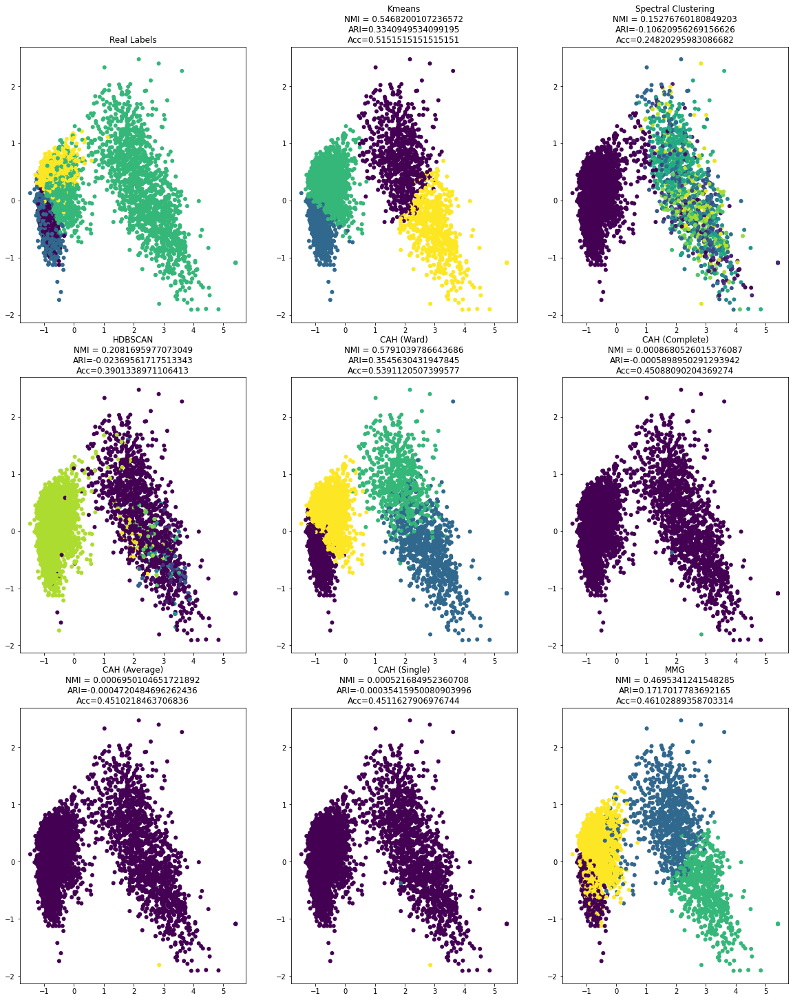

time: 1.71 s (started: 2021-12-05 13:28:34 +00:00)


In [25]:
results_classic4_glove_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

En visualisant l'espace en utilisant l'ACP à 2 dimensions, nous pouvons voir que les classes sont difficiles à séparer. 

Les résultats ci-dessus montrent que les différentes méthodes de classification utilisées ne sont pas capables de séparer les classes dans leur espace d'origine, car la plupart d'entre elles sont proches de l'estimation aléatoire des étiquettes (ARI proche de 0 ou <0).
Il est intéressant de noter que les modèles Kmeans, CAH(Ward) et MMG font mieux que les autres modèles, mais qu'il n'apporte toujours pas d'amélioration significative pour faire des interpretations.

Nous pouvons également remarquer que la précision n'est pas la meilleure métrique pour évaluer la performance des classificateurs car la classe "cacm" a le plus d'individus, confirmant ainsi l'hypothèse que nous soupçonnions précédemment. 

#### Espace Reduit

PCA avec 2 composantes

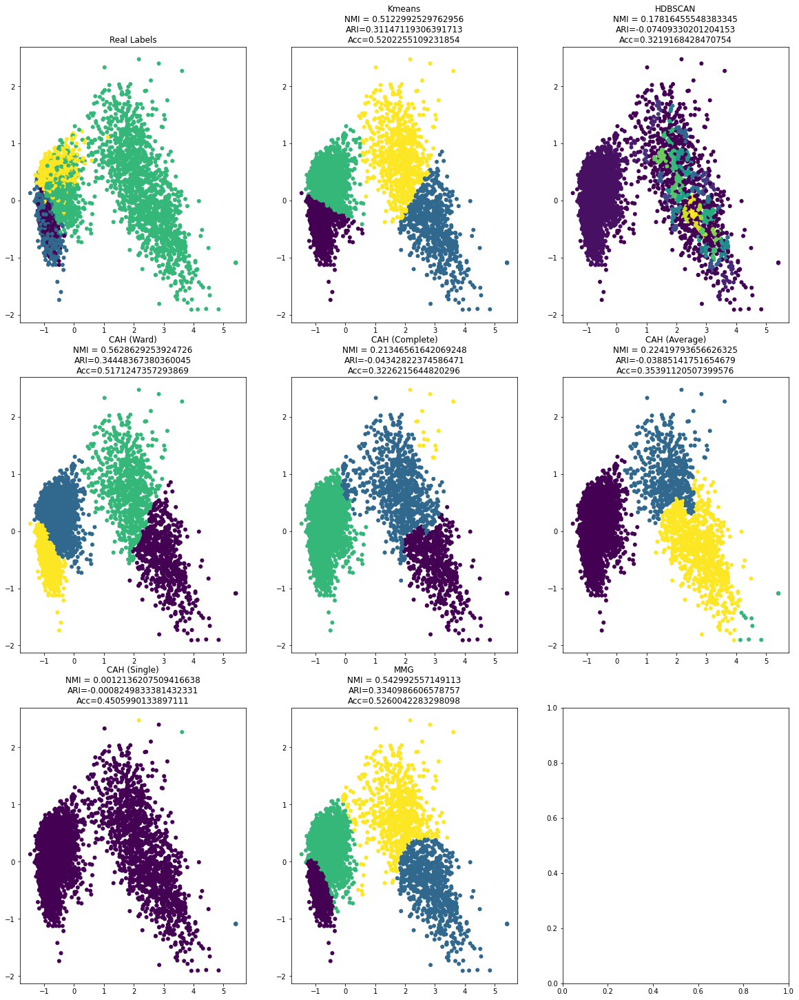

time: 7.61 s (started: 2021-12-05 13:36:17 +00:00)


In [45]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_glove)
results_classic4_glove_redim['pca2'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

PCA avec 20 composantes

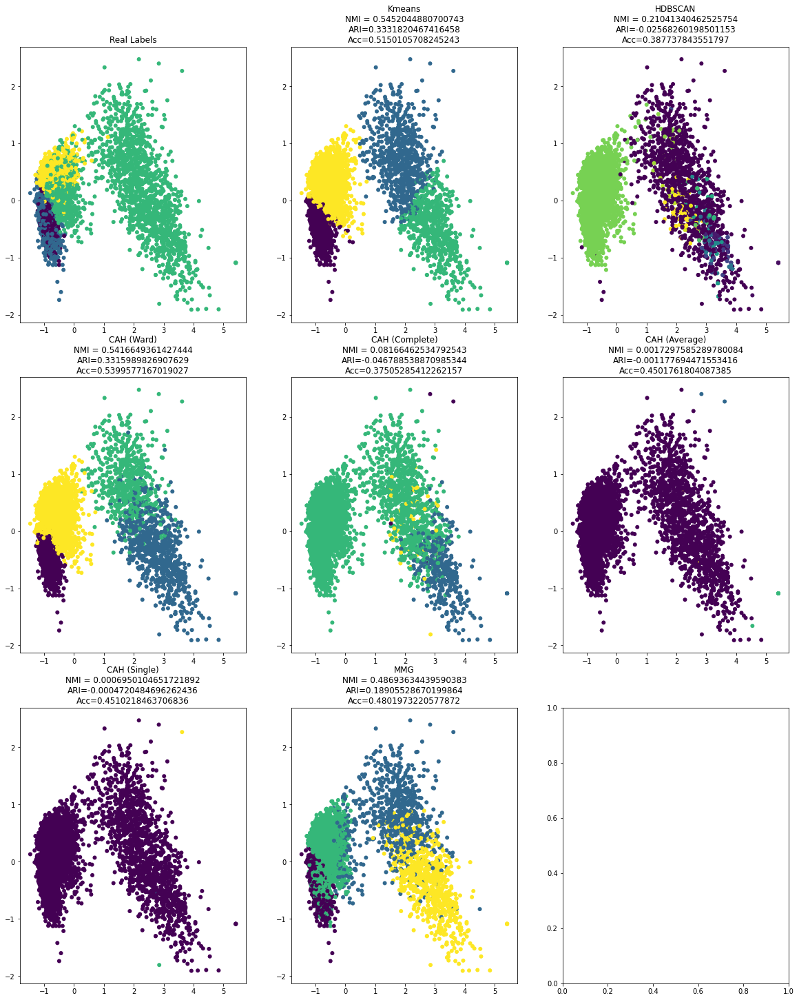

time: 10.2 s (started: 2021-12-05 13:36:25 +00:00)


In [46]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(classic4_glove)
results_classic4_glove_redim['pca20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- Nous pouvons voir que l'utilisation d'une ACP à 2 ou 20 composantes a dégradé les performances des classifieurs utilisés puisque l'espace dans lequel nous projetons les données n'est pas bon pour séparer les différents classifications.

- Passer de 2 à 20 composantes n'améliore pas la performance des classificateurs.

- Kmeans, CAH(Ward), et MMG sont les seuls a avoir a ARI positif mais faible.

TSNE

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


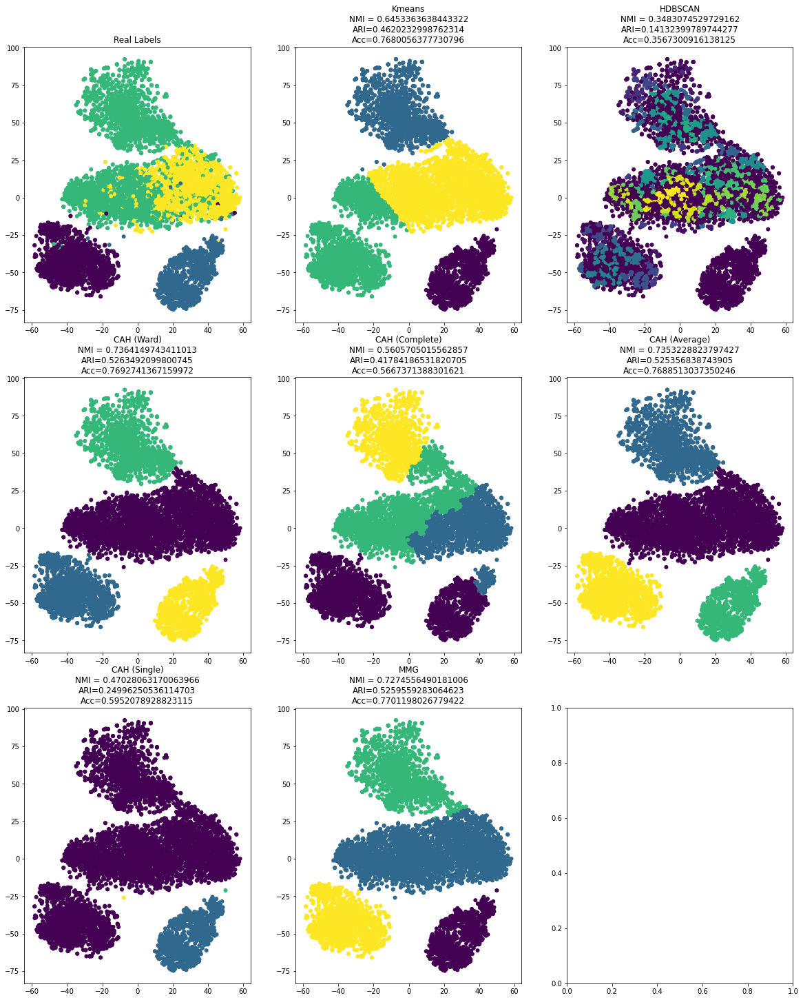

time: 52.3 s (started: 2021-12-05 13:36:35 +00:00)


In [47]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_glove)
results_classic4_glove_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic4, map_labels(classic4_labels))

- L'espace issu de l'application de tSNE aux données a amélioré de manière significative les performances de tous les modèles.
- La différence de performance entre les projections PCA et tSNE varie entre les différents modèles.
    - L'espace issu de l'application de tSNE aux données a amélioré de manière significative la performance du modèle Kmeans ; nous pouvons voir que le NMI est passé de 0,54 (espace original) à 0,645 et l'ARI de 0.33 à 0,46, ce qui est une valeur acceptable.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle HDBSCAN, mais pas de manière aussi significative que le modèle Kmeans. L'ARI est toujours proche de 0, ce qui signifie que le modèle est toujours comme s'il devinait les étiquettes.
    - Les CAH avec les différentes méthodes de linkage se sont tous améliorés. l'ARI pour ces modèles varie entre 0.24 et 0.52 ce qui est une valeur acceptable, avec un NMI entre 0.47 et 0.73. Le modèle CAH avec lien de la moyenne et ward sont les plus performants des modèles CAH et battent même les résultats obtenus avec Kmeans.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle MMG qui passe de 0,3 ARI en ACP à 0,52 et de 0,57 NMI à 0,72.

- La précision pour Kmeans, CAH et MMG est la même (77%). Si nous utilisons le NMI pour comparer les modèles, nous pouvons voir que les modèles CAH prennent le dessus sur MMG mais par une petite marge.   

UMAP

In [48]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_glove)

time: 12 s (started: 2021-12-05 13:37:27 +00:00)


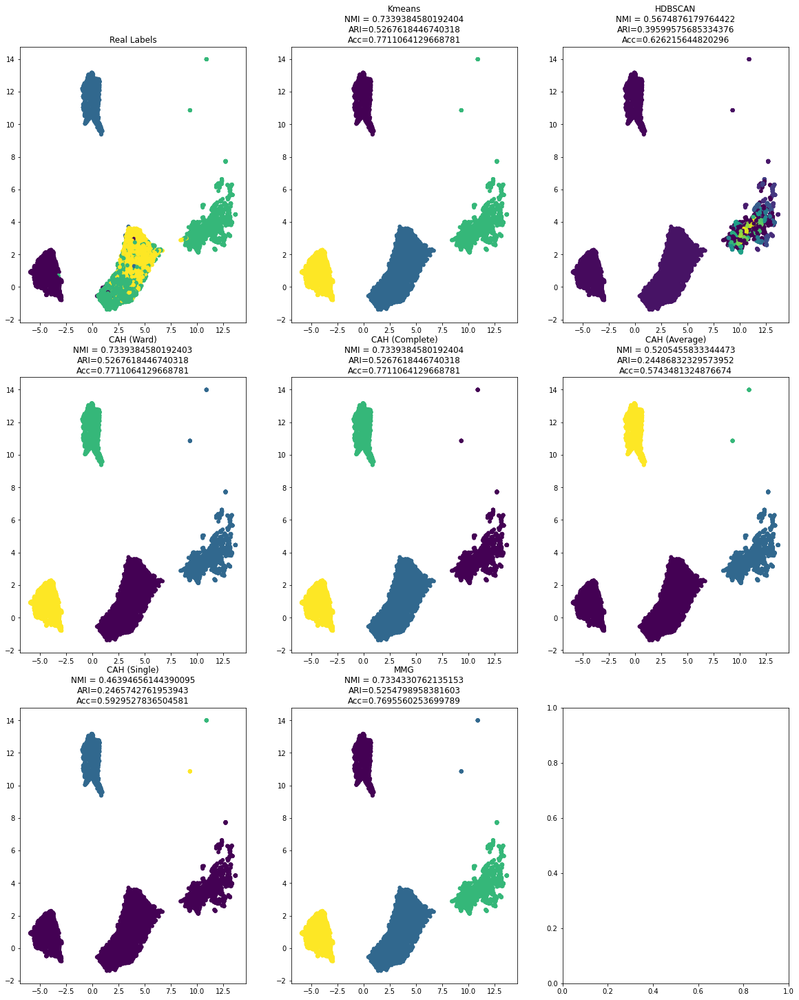

time: 6.15 s (started: 2021-12-05 13:37:39 +00:00)


In [49]:
results_classic4_glove_redim['umap'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

In [50]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(classic4_glove)

time: 25 s (started: 2021-12-05 13:37:46 +00:00)


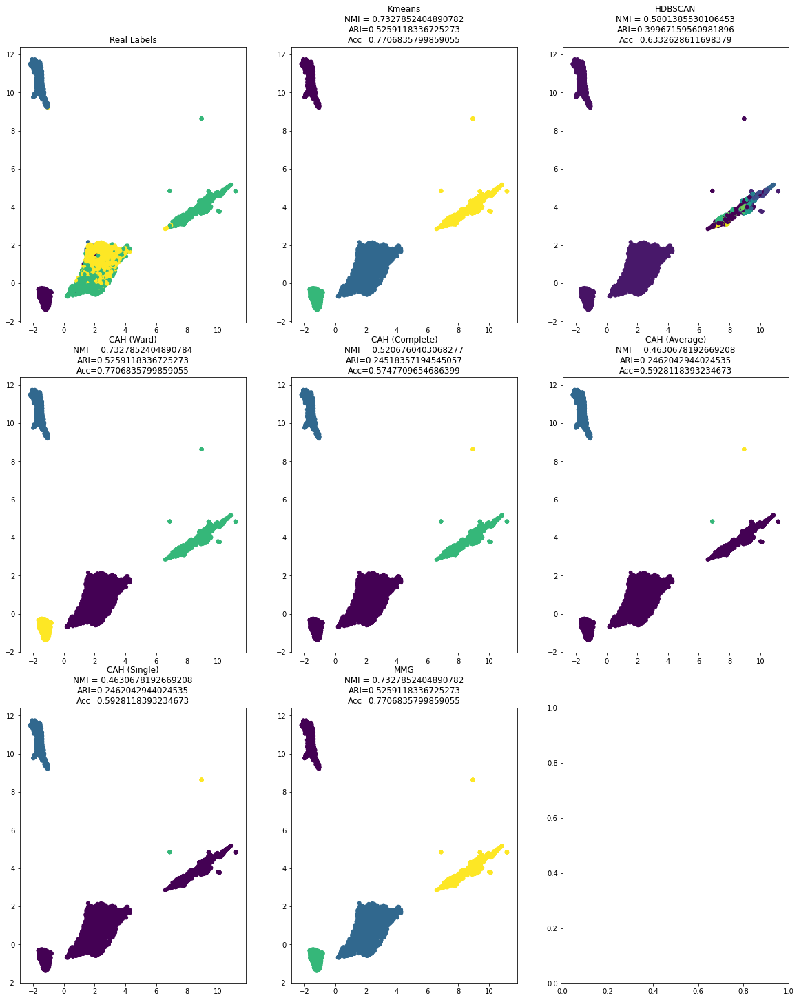

time: 8.03 s (started: 2021-12-05 13:38:11 +00:00)


In [51]:
results_classic4_glove_redim['umap20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- L'espace issu de l'application de l'UMAP aux données a considérablement amélioré les performances de tous les modèles de l'espace original.

    - Kmeans sous UMAP est meilleur que l'espace original et que tSNE, surtout lorsqu'un nombre plus élevé de composantes est utilisé ; il prend la tête des performances avec le NMI et l'ARI les plus élevés ainsi qu'une précision de 77%.
    - Nous pouvons constater que la méthode de liaison a un impact important sur les performances du modèle CAH. La mesure de distance doit être choisie avec soin en fonction de l'espace des données. Sous 2 composants, le lien maximum est le meilleur CAH, mais sous 20 composants, il est nettement meilleur et ses performances sont très proches de celles de Kmeans.
    - Le modèle MMG est toujours meilleur avec plus d'informations, ce qui explique l'augmentation de la performance entre 2 et 20 composantes, mais cette fois-ci, il a les memes performances que Kmeans et CAH (Ward). 
    - On peut remarquer que les modeles les plus stables en terme de performances a travers les methodes de redim sont le CAH(ward) et le MMG

Autoencoder

In [52]:
n_components=2
X_reduced = autoencoder(classic4_glove.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:13<00:00,  3.74it/s]

time: 13.4 s (started: 2021-12-05 13:38:19 +00:00)


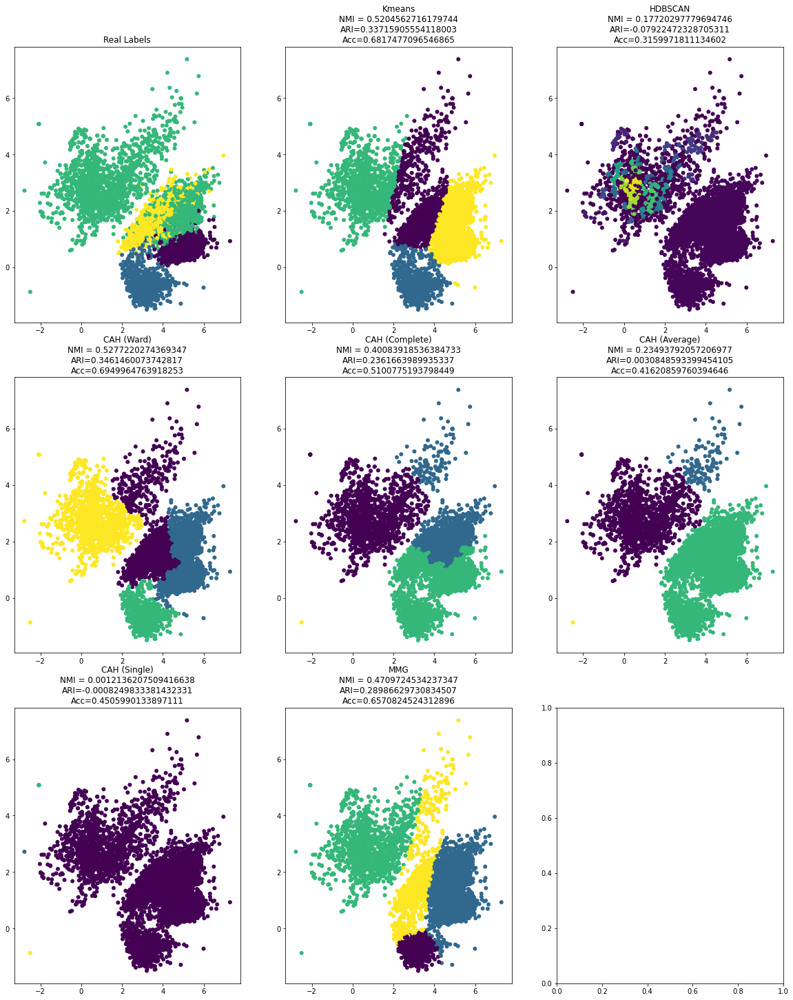

time: 6.35 s (started: 2021-12-05 13:38:32 +00:00)


In [53]:
results_classic4_glove_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- D'après les résultats de l'application des différentes méthodes de classification sur l'espace issu de l'autoencodeur, nous pouvons voir :
    - Tous les modèles font mieux que sous l'espace original et l'ACP mais n'atteignent pas leurs performances sous tSNE et UMAP.
    - Kmeans et CAH(Ward) sont les meilleures des modeles avec une NMI de 0.52 et ARI de 0.34 et une precision de 69%

#### Interpretations des resultats 

In [54]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_glove_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.61 ms (started: 2021-12-05 13:38:38 +00:00)


In [55]:
results_glove_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 3.05 ms (started: 2021-12-05 13:38:38 +00:00)


Tableau des metriques

In [56]:
results_glove_classic4

nmi       ari       acc
original    Kmeans               0.546820  0.334095  0.515152
            Spectral Clustering  0.152768 -0.106210  0.248203
            HDBSCAN              0.208170 -0.023696  0.390134
            CAH (Ward)           0.579104  0.354563  0.539112
            CAH (Complete)       0.000868 -0.000590  0.450881
            CAH (Average)        0.000695 -0.000472  0.451022
            CAH (Single)         0.000522 -0.000354  0.451163
            MMG                  0.469534  0.171702  0.461029
pca2        Kmeans               0.512299  0.311471  0.520226
            HDBSCAN              0.178165 -0.074093  0.321917
            CAH (Ward)           0.562863  0.344484  0.517125
            CAH (Complete)       0.213466 -0.043428  0.322622
            CAH (Average)        0.224198 -0.038851  0.353911
            CAH (Single)         0.001214 -0.000825  0.450599
            MMG                  0.542993  0.334099  0.526004
pca20       Kmeans               0.545204  0.333182  0.515011
            HDBSCAN              0.210413 -0.025683  0.387738
            CAH (Ward)           0.541665  0.331599  0.539958
            CAH (Complete)       0.081665 -0.046789  0.375053
            CAH (Average)        0.001730 -0.001178  0.450176
            CAH (Single)         0.000695 -0.000472  0.451022
            MMG                  0.486936  0.189055  0.480197
tsne        Kmeans               0.645336  0.462023  0.768006
            HDBSCAN              0.348307  0.141324  0.356730
            CAH (Ward)           0.736415  0.526349  0.769274
            CAH (Complete)       0.560571  0.417842  0.566737
            CAH (Average)        0.735323  0.525357  0.768851
            CAH (Single)         0.470281  0.249963  0.595208
            MMG                  0.727456  0.525956  0.770120
umap        Kmeans               0.733938  0.526762  0.771106
            HDBSCAN              0.567488  0.395996  0.626216
            CAH (Ward)           0.733938  0.526762  0.771106
            CAH (Complete)       0.733938  0.526762  0.771106
            CAH (Average)        0.520546  0.244868  0.574348
            CAH (Single)         0.463947  0.246574  0.592953
            MMG                  0.733433  0.525480  0.769556
umap20      Kmeans               0.732785  0.525912  0.770684
            HDBSCAN              0.580139  0.399672  0.633263
            CAH (Ward)           0.732785  0.525912  0.770684
            CAH (Complete)       0.520676  0.245184  0.574771
            CAH (Average)        0.463068  0.246204  0.592812
            CAH (Single)         0.463068  0.246204  0.592812
            MMG                  0.732785  0.525912  0.770684
autoencoder Kmeans               0.520456  0.337159  0.681748
            HDBSCAN              0.177203 -0.079225  0.315997
            CAH (Ward)           0.527722  0.346146  0.694996
            CAH (Complete)       0.400839  0.236166  0.510078
            CAH (Average)        0.234938  0.003085  0.416209
            CAH (Single)         0.001214 -0.000825  0.450599
            MMG                  0.470972  0.289866  0.657082

time: 10.5 ms (started: 2021-12-05 13:38:38 +00:00)


Les meilleurs methodes selon les 3 metriques

In [64]:
metric = "ari"
results_glove_classic4[results_glove_classic4[metric] == results_glove_classic4[metric].max()]

nmi       ari       acc
umap Kmeans          0.733938  0.526762  0.771106
     CAH (Ward)      0.733938  0.526762  0.771106
     CAH (Complete)  0.733938  0.526762  0.771106

time: 6.78 ms (started: 2021-12-05 13:48:54 +00:00)


In [65]:
metric = "nmi"
results_glove_classic4[results_glove_classic4[metric] == results_glove_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Ward),0.736415,0.526349,0.769274


time: 8.96 ms (started: 2021-12-05 13:48:55 +00:00)


In [66]:
metric = "acc"
results_glove_classic4[results_glove_classic4[metric] == results_glove_classic4[metric].max()]

nmi       ari       acc
umap Kmeans          0.733938  0.526762  0.771106
     CAH (Ward)      0.733938  0.526762  0.771106
     CAH (Complete)  0.733938  0.526762  0.771106

time: 12.5 ms (started: 2021-12-05 13:48:56 +00:00)


Le meilleur model c'est le CAH (Ward) avec UMAP de 2 composantes ou TSNE

In [68]:
X_reduced_best = UMAP(n_components=2, random_state=42).fit_transform(classic4_glove)
best_labels = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(X_reduced_best)

time: 13.7 s (started: 2021-12-05 13:50:58 +00:00)


In [69]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 857 µs (started: 2021-12-05 13:51:12 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 0


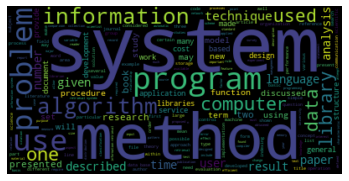



Class: 2


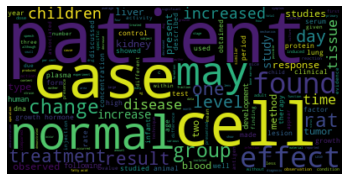



Class: 1


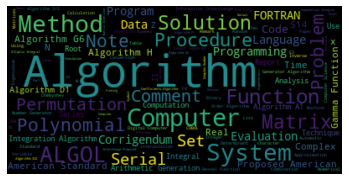



Class: 3


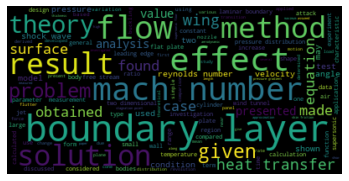



time: 3.92 s (started: 2021-12-05 13:51:12 +00:00)


In [70]:
print_wordcloud(df['text'].values, best_labels)

Class: cacm


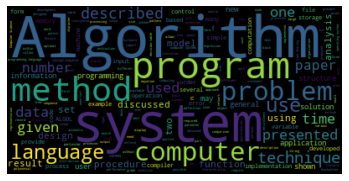



Class: cisi


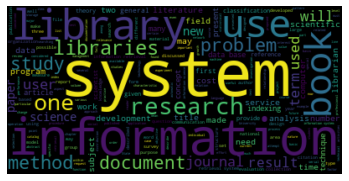



Class: med


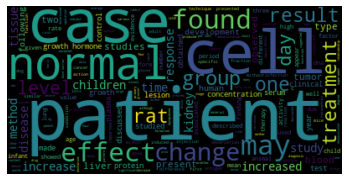



Class: cran


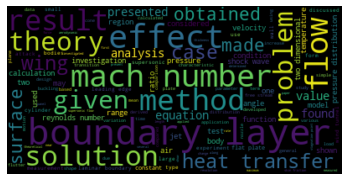



time: 3.91 s (started: 2021-12-05 13:51:16 +00:00)


In [71]:
print_wordcloud(df['text'].values, df['label'].values)

En visualisant les nuages de mots et en les comparant, nous pouvons voir que les classes prédites sont les suivantes :
- La classe 0 est approximativement la classe "cisi" car on peut voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 1 est approximativement la classe "cacm" car nous pouvons voir que ce sont les mêmes termes les plus fréquents dans les deux classes.
- La classe 2 correspond approximativement à la classe "med", car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 3 est approximativement la classe "cran" car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.


## BBC

In [72]:
results_bbc_redim = {}
results_bbc_glove_redim = {}

time: 480 µs (started: 2021-12-05 13:54:22 +00:00)


In [73]:
df_bbc.groupby("label").size()

label
business         510
entertainment    386
politics         417
sport            511
tech             401
dtype: int64

time: 4.2 ms (started: 2021-12-05 13:54:23 +00:00)


Nous pouvons voir que les classes sont plus ou moins de la même taille.

### word2vec

#### Espace Original

In [74]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_word2vec)
kmeans_labels = KMeans(k_bbc, random_state=42).fit(bbc_word2vec).labels_
spectral_labels = SpectralClustering(k_bbc, n_components= bbc_word2vec.shape[1], assign_labels="discretize", random_state=42).fit(bbc_word2vec).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(bbc_word2vec).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_bbc).fit_predict(bbc_word2vec)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_bbc, linkage="complete").fit_predict(bbc_word2vec)
cah_labels_average = AgglomerativeClustering(n_clusters=k_bbc, linkage="average").fit_predict(bbc_word2vec)
cah_labels_single = AgglomerativeClustering(n_clusters=k_bbc, linkage="single").fit_predict(bbc_word2vec)
gaussian = GaussianMixture(n_components=k_bbc, random_state=42).fit_predict(bbc_word2vec)

time: 13.9 s (started: 2021-12-05 13:55:52 +00:00)


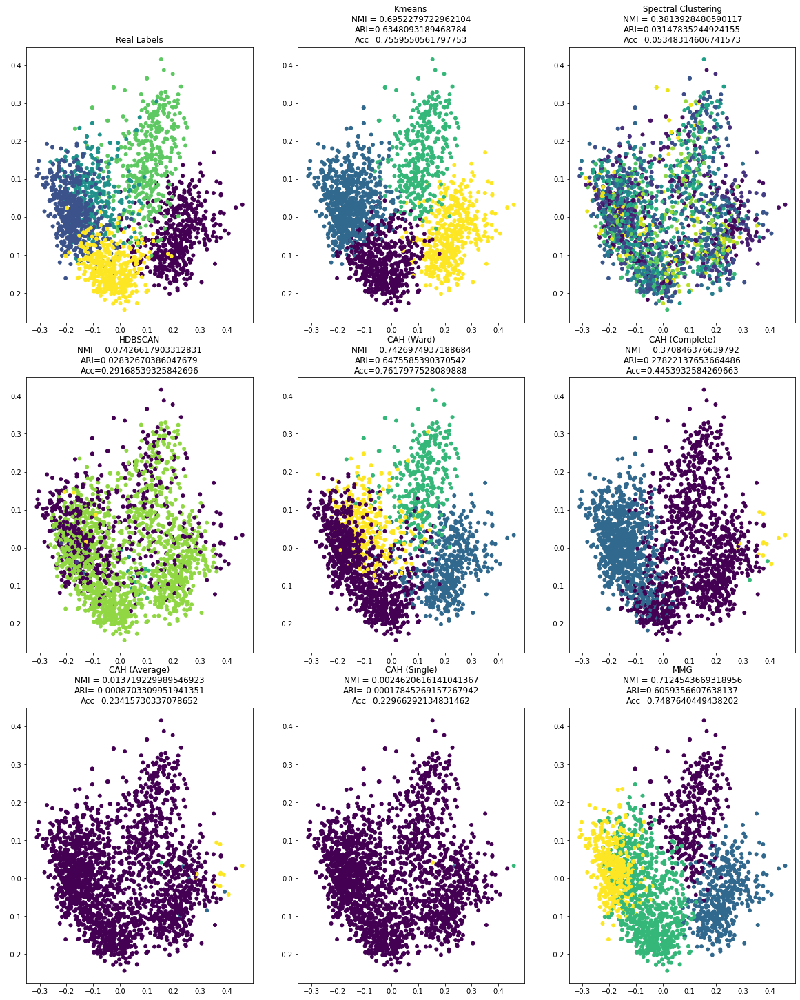

time: 1.53 s (started: 2021-12-05 13:56:06 +00:00)


In [75]:
results_bbc_redim["original"] = eval_clustering_2D(X_reduced, map_labels(bbc_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

En visualisant l'espace en utilisant l'ACP à 2 dimensions, nous pouvons voir que les classes sont difficiles à séparer. 

Les résultats ci-dessus montrent que les différentes méthodes de classification utilisées ne sont pas capables de séparer les classes dans leur espace d'origine, car la plupart d'entre elles sont proches de l'estimation aléatoire des étiquettes (ARI proche de 0 ou <0).
Il est intéressant de noter que le modèle MMG fait mieux que les autres modèles, mais qu'il n'apporte toujours pas d'amélioration significative par rapport aux autres modèles.

Nous pouvons également remarquer que la précision n'est pas la meilleure métrique pour évaluer la performance des classificateurs car la classe "cacm" a le plus d'individus, confirmant ainsi l'hypothèse que nous soupçonnions précédemment. 

Nous n'exécuterons pas le clustering spectral dans les expériences suivantes en raison de ses temps d'exécution élevés.

#### Espace Reduit

PCA avec 2 composantes

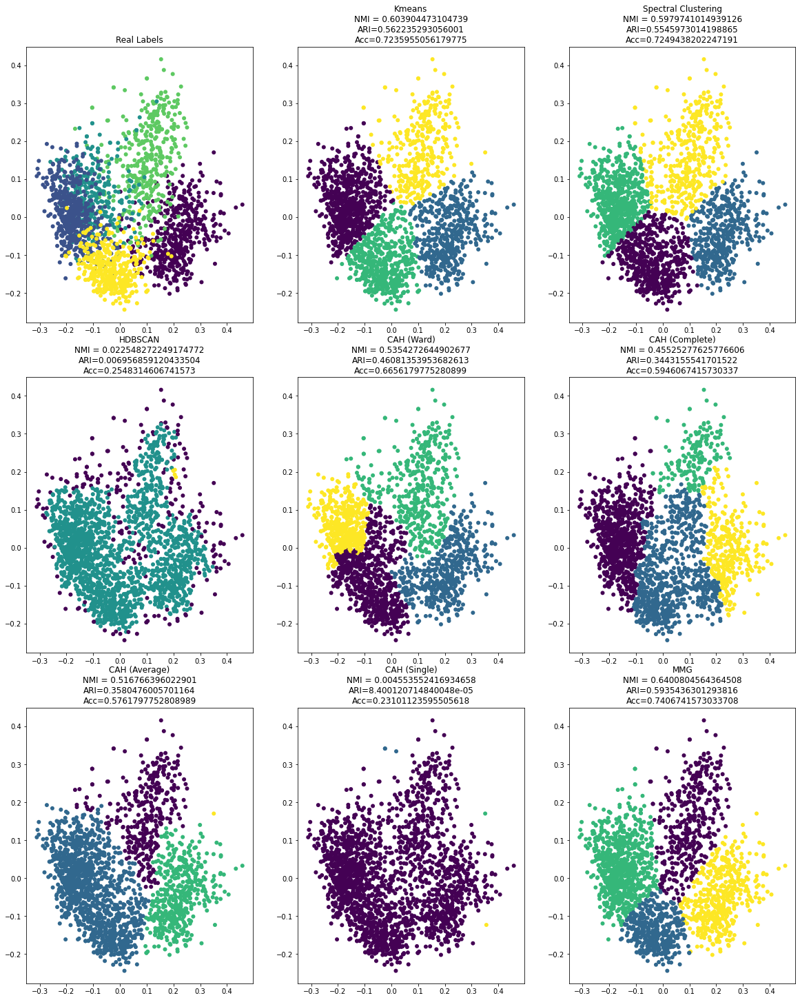

time: 2.42 s (started: 2021-12-05 13:57:21 +00:00)


In [76]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(bbc_word2vec)
results_bbc_redim['pca2'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

PCA avec 20 composantes

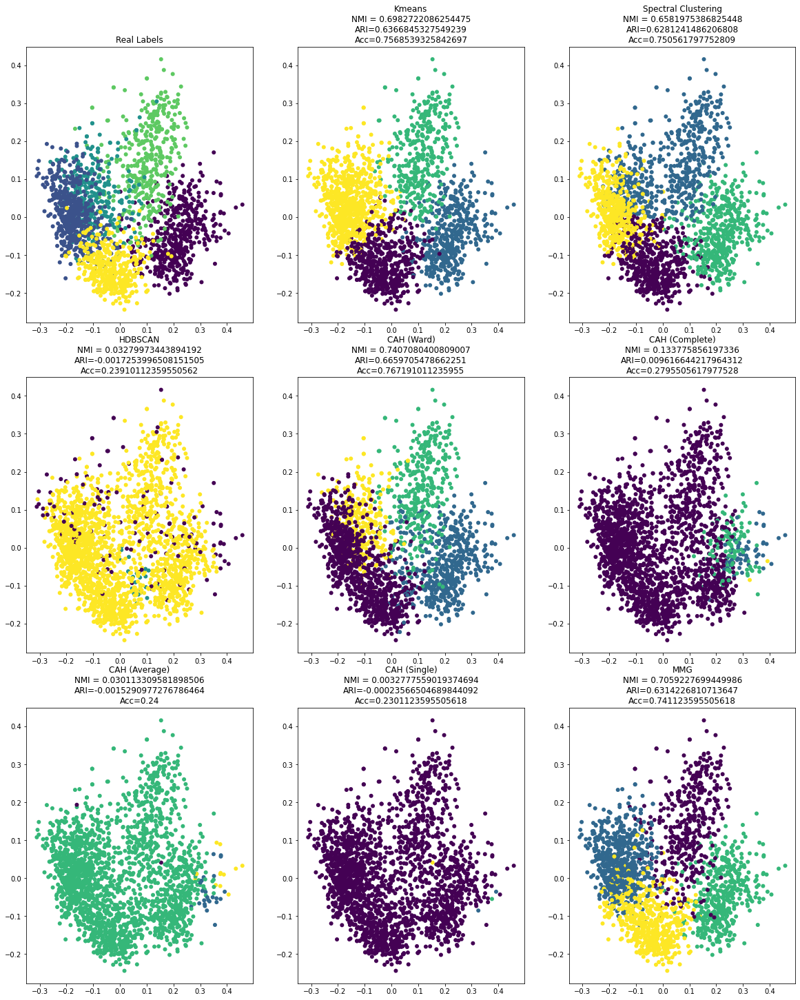

time: 3.48 s (started: 2021-12-05 13:57:41 +00:00)


In [77]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(bbc_word2vec)
results_bbc_redim['pca20'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

- Nous pouvons voir que l'utilisation d'une ACP à 2 ou 20 composantes n'aide pas à améliorer les performances des classifieurs utilisés puisque l'espace dans lequel nous projetons les données n'est pas bon pour séparer les différents classifications.

- Tout comme dans l'espace original, le MMG fait mieux que les autres classificateurs.

- Passer de 2 à 20 composantes n'améliore pas la performance des classificateurs sauf pour le MMG qui améliore significativement l'ARI et le NMI.

TSNE

In [ ]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(bbc_word2vec)
results_bbc_redim['tsne'] = run_clustering(X_reduced_tsne, k_bbc, map_labels(bbc_labels), spectral=True)

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


- L'espace issu de l'application de tSNE aux données a amélioré de manière significative les performances de tous les modèles.
- La différence de performance entre les projections PCA et tSNE varie entre les différents modèles.
    - L'espace issu de l'application de tSNE aux données a amélioré de manière significative la performance du modèle Kmeans ; nous pouvons voir que le NMI est passé de 0,2 à 0,6 et l'ARI d'une valeur négative à 0,45, ce qui est une valeur acceptable.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle HDBSCAN, mais pas de manière aussi significative que le modèle Kmeans. L'ARI est toujours proche de 0, ce qui signifie que le modèle est toujours comme s'il devinait les étiquettes.
    - Les CAH avec les différentes méthodes de linkage se sont tous améliorés sauf pour le linkage minimal, l'ARI pour ces modèles varie entre 0.41 et 0.49 ce qui est une valeur acceptable avec un NMI entre 0.56 et 0.68. Le modèle CAH avec lien moyen est le plus performant des modèles CAH et bat même les résultats obtenus avec Kmeans.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle MMG qui passe de 0,3 ARI en ACP à 0,5 et de 0,57 NMI à 0,68.

- La précision pour Kmeans, CAH et MMG est la même (75%). Si nous utilisons le NMI pour comparer les modèles, nous pouvons voir que le modèle MMG est toujours le modèle le plus performant, mais par une petite marge.   


UMAP

In [ ]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(bbc_word2vec)

In [ ]:
results_bbc_redim['umap'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels), spectral=True)

In [55]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(bbc_word2vec)

time: 25.3 s (started: 2021-12-05 12:35:57 +00:00)


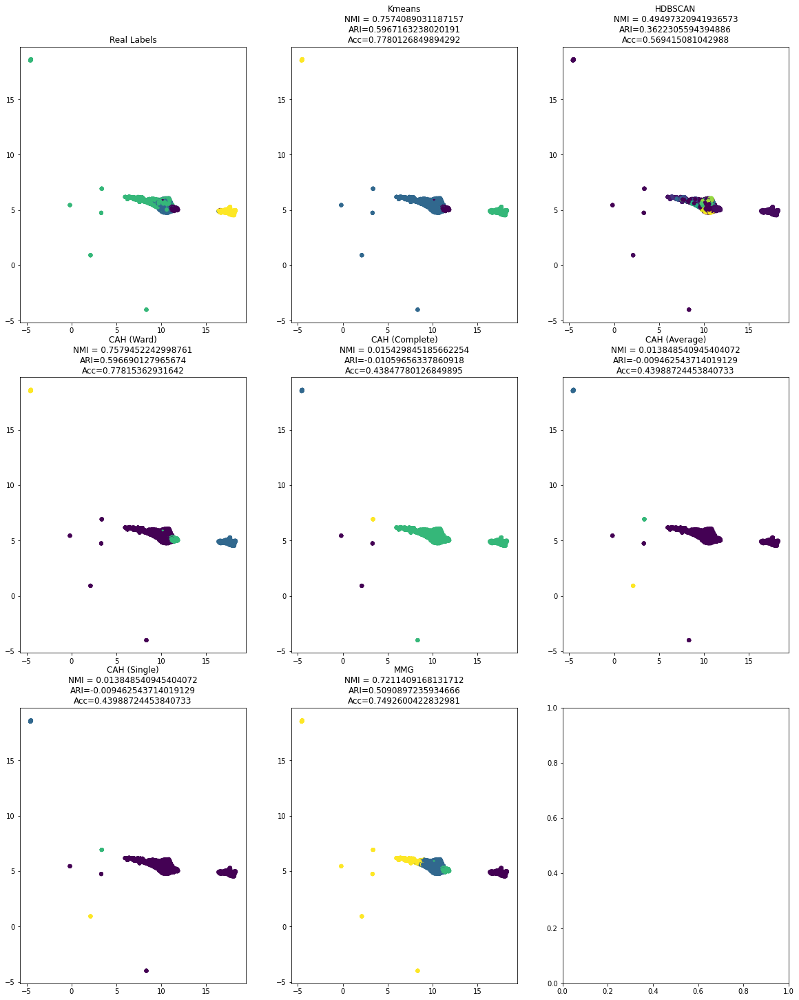

time: 8.01 s (started: 2021-12-05 12:36:22 +00:00)


In [56]:
results_bbc_redim['umap0'] = run_clustering(X_reduced, k_bbc, map_labels(bbc_labels))

- L'espace issu de l'application de l'UMAP aux données a considérablement amélioré les performances de tous les modèles de l'espace original.

    - Kmeans sous UMAP est meilleur que l'espace original et que tSNE, surtout lorsqu'un nombre plus élevé de composantes est utilisé ; il prend la tête des performances avec le NMI et l'ARI les plus élevés ainsi qu'une précision de 77%.
    - Nous pouvons constater que la méthode de liaison a un impact important sur les performances du modèle CAH. La mesure de distance doit être choisie avec soin en fonction de l'espace des données. Sous 2 composants, le lien maximum est le meilleur CAH, mais sous 20 composants, il est nettement meilleur et ses performances sont très proches de celles de Kmeans.
    - Le modèle MMG est toujours meilleur avec plus d'informations, ce qui explique l'augmentation de la performance entre 2 et 20 composantes, mais cette fois-ci, il est moins performant que Kmeans et CAH (Ward). 

Autoencoder

In [58]:
n_components=2
X_reduced = autoencoder(classic4_word2vec.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:13<00:00,  3.65it/s]

time: 13.8 s (started: 2021-12-05 12:38:21 +00:00)


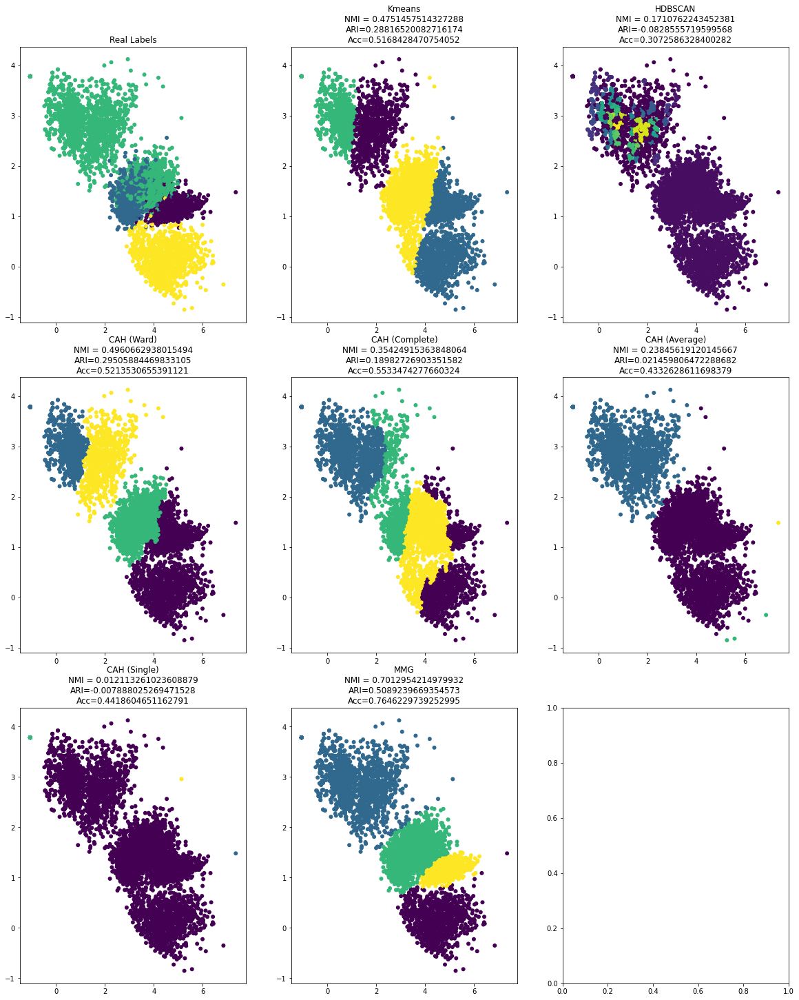

time: 6.27 s (started: 2021-12-05 12:38:35 +00:00)


In [59]:
results_classic4_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- Nous avons testé différentes architectures pour l'autoencodeur :
    - Si nous ajoutons une couche, le modèle n'apprendra rien, nous soupçonnons le problème du gradient de fuite avec les petits ensembles de données que nous avons.
    - si nous augmentons la taille de la couche cachée, le modèle aura du mal à apprendre aussi, nous avons fait quelques expériences avec la taille de la couche cachée et avons décidé d'aller avec 256.

- D'après les résultats de l'application des différentes méthodes de classification sur l'espace issu de l'autoencodeur, nous pouvons voir :
    - Tous les modèles font mieux que sous l'espace original et l'ACP mais n'atteignent pas leurs performances sous tSNE et UMAP.
    - MMG a obtenu sa meilleure performance sous l'espace d'autoencodage avec un NMI de 0.7 et un ARI de 0.5 avec une précision de 76%.

#### Interpretations des resultats 

In [60]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.06 ms (started: 2021-12-05 12:38:41 +00:00)


In [61]:
results_word2vec_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 2.91 ms (started: 2021-12-05 12:38:41 +00:00)


Tableau des metriques

In [62]:
results_word2vec_classic4

nmi       ari       acc
original    Kmeans               0.218916 -0.049318  0.330937
            Spectral Clustering  0.156745 -0.104473  0.238196
            HDBSCAN              0.204511 -0.028608  0.384073
            CAH (Ward)           0.221556 -0.049277  0.321212
            CAH (Complete)       0.002416 -0.001646  0.449612
            CAH (Average)        0.000522 -0.000354  0.451163
            CAH (Single)         0.000522 -0.000354  0.451163
            MMG                  0.467672  0.185057  0.500775
pca2        Kmeans               0.218993 -0.048336  0.335870
            HDBSCAN              0.175478 -0.078413  0.288795
            CAH (Ward)           0.215684 -0.052603  0.323467
            CAH (Complete)       0.218577 -0.031889  0.377308
            CAH (Average)        0.227074 -0.011426  0.402537
            CAH (Single)         0.011944 -0.008089  0.441579
            MMG                  0.219745 -0.043005  0.327414
pca20       Kmeans               0.218894 -0.049439  0.330233
            HDBSCAN              0.206966 -0.022090  0.390416
            CAH (Ward)           0.225017 -0.031673  0.374066
            CAH (Complete)       0.061478 -0.037469  0.395490
            CAH (Average)        0.012434 -0.008417  0.441156
            CAH (Single)         0.000522 -0.000354  0.451163
            MMG                  0.574315  0.377036  0.586469
tsne        Kmeans               0.619635  0.450235  0.752925
            HDBSCAN              0.351751  0.145171  0.366737
            CAH (Ward)           0.628455  0.480589  0.782805
            CAH (Complete)       0.568745  0.411789  0.729528
            CAH (Average)        0.681420  0.496782  0.753206
            CAH (Single)         0.461908  0.239177  0.585060
            MMG                  0.685889  0.502425  0.759831
umap        Kmeans               0.681254  0.493522  0.749965
            HDBSCAN              0.534970  0.378280  0.607752
            CAH (Ward)           0.666850  0.492157  0.750951
            CAH (Complete)       0.719314  0.581389  0.772234
            CAH (Average)        0.445825  0.235151  0.581536
            CAH (Single)         0.015430 -0.010597  0.438478
            MMG                  0.661623  0.490647  0.751515
autoencoder Kmeans               0.475146  0.288165  0.516843
            HDBSCAN              0.171076 -0.082856  0.307259
            CAH (Ward)           0.496066  0.295059  0.521353
            CAH (Complete)       0.354249  0.189827  0.553347
            CAH (Average)        0.238456  0.021460  0.433263
            CAH (Single)         0.012113 -0.007888  0.441860
            MMG                  0.701295  0.508924  0.764623
umap20      Kmeans               0.757409  0.596716  0.778013
            HDBSCAN              0.494973  0.362231  0.569415
            CAH (Ward)           0.757945  0.596690  0.778154
            CAH (Complete)       0.015430 -0.010597  0.438478
            CAH (Average)        0.013849 -0.009463  0.439887
            CAH (Single)         0.013849 -0.009463  0.439887
            MMG                  0.721141  0.509090  0.749260

time: 11.2 ms (started: 2021-12-05 12:38:41 +00:00)


Les meilleurs methodes selon les 3 metriques

In [63]:
metric = "ari"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
umap20,Kmeans,0.757409,0.596716,0.778013


time: 6.72 ms (started: 2021-12-05 12:38:41 +00:00)


In [64]:
metric = "nmi"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
umap20,CAH (Ward),0.757945,0.59669,0.778154


time: 6.56 ms (started: 2021-12-05 12:38:41 +00:00)


In [65]:
metric = "acc"
results_word2vec_classic4[results_word2vec_classic4[metric] == results_word2vec_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Ward),0.628455,0.480589,0.782805


time: 6.87 ms (started: 2021-12-05 12:38:41 +00:00)


Le meilleur compromi c'est le CAH (Ward) avec UMAP de 20 composantes

In [17]:
X_reduced_tsne = UMAP(n_components=20, random_state=42).fit_transform(classic4_word2vec)
best_labels = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(X_reduced_tsne)

time: 27.7 s (started: 2021-12-05 13:17:55 +00:00)


In [18]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 37.9 ms (started: 2021-12-05 13:18:22 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 0


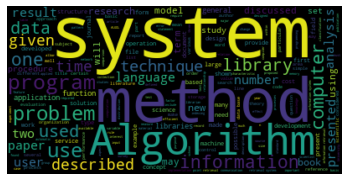



Class: 1


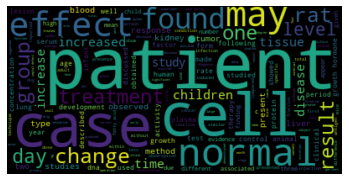



Class: 2


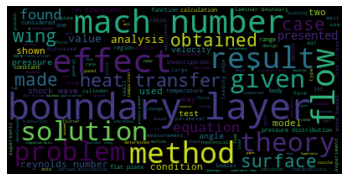



Class: 3


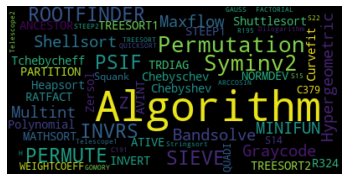



time: 3.73 s (started: 2021-12-05 13:18:22 +00:00)


In [19]:
print_wordcloud(df['text'].values, best_labels)

Class: cacm


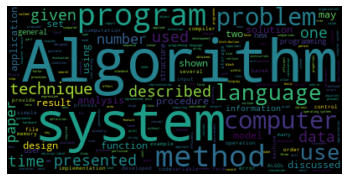



Class: cisi


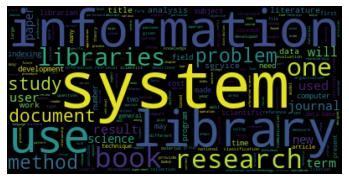



Class: med


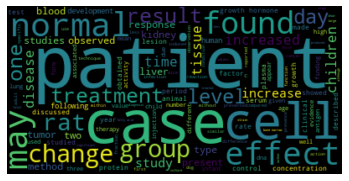



Class: cran


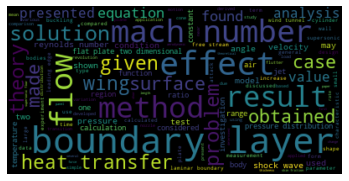



time: 3.73 s (started: 2021-12-05 13:18:26 +00:00)


In [20]:
print_wordcloud(df['text'].values, df['label'].values)

En visualisant les nuages de mots et en les comparant, nous pouvons voir que les classes prédites sont les suivantes :
- La classe 0 est approximativement la classe "cacm" car nous pouvons voir que ce sont les mêmes termes les plus fréquents dans les deux classes.
- La classe 1 correspond approximativement à la classe "med", car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 2 est approximativement la classe "cran" car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 3 est approximativement la classe "cisi" car on peut voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.

### GloVe

#### Espace Original

In [22]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_glove)
kmeans_labels = KMeans(k_classic4, random_state=42).fit(classic4_glove).labels_
spectral_labels = SpectralClustering(k_classic4, n_components= classic4_glove.shape[1], assign_labels="discretize", random_state=42).fit(classic4_glove).labels_
hdbscan_labels = hdbscan.HDBSCAN(algorithm="best", alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(classic4_glove).labels_
cah_labels_ward = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(classic4_glove)
cah_labels_complete = AgglomerativeClustering(n_clusters=k_classic4, linkage="complete").fit_predict(classic4_glove)
cah_labels_average = AgglomerativeClustering(n_clusters=k_classic4, linkage="average").fit_predict(classic4_glove)
cah_labels_single = AgglomerativeClustering(n_clusters=k_classic4, linkage="single").fit_predict(classic4_glove)
gaussian = GaussianMixture(n_components=k_classic4, random_state=42).fit_predict(classic4_glove)

time: 1min 54s (started: 2021-12-05 13:25:57 +00:00)


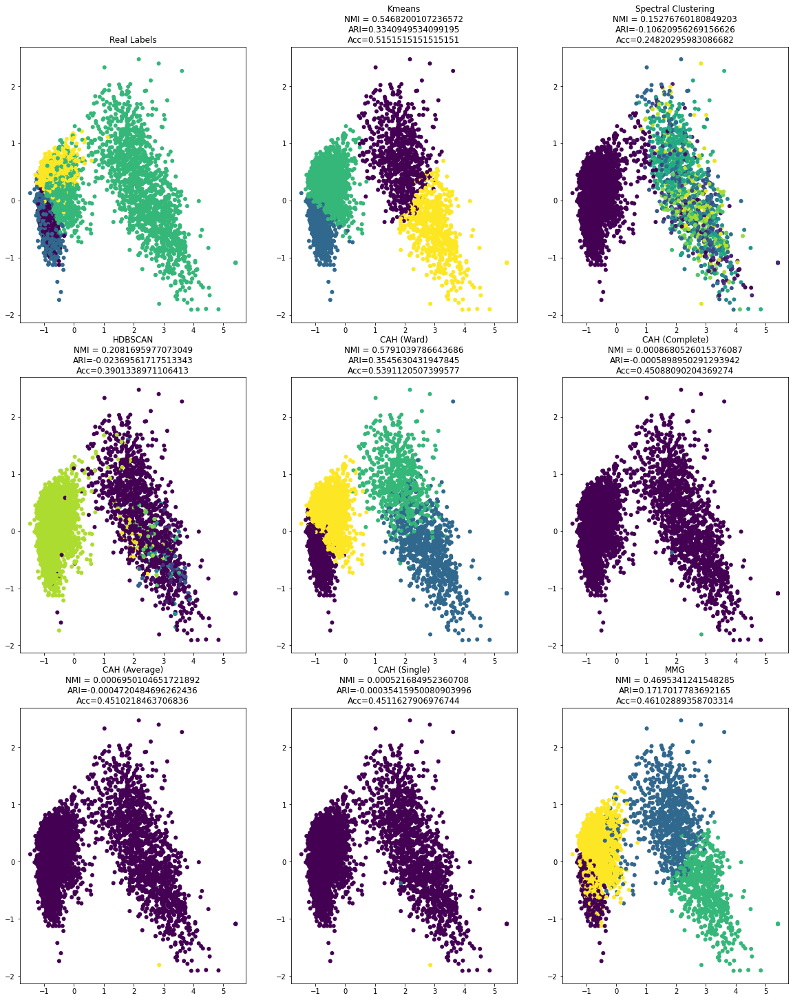

time: 1.71 s (started: 2021-12-05 13:28:34 +00:00)


In [25]:
results_classic4_glove_redim["original"] = eval_clustering_2D(X_reduced, map_labels(classic4_labels), [kmeans_labels, spectral_labels, hdbscan_labels, cah_labels_ward, cah_labels_complete, cah_labels_average, cah_labels_single, gaussian], ["Kmeans", "Spectral Clustering", "HDBSCAN", "CAH (Ward)", "CAH (Complete)","CAH (Average)", "CAH (Single)", "MMG"])

En visualisant l'espace en utilisant l'ACP à 2 dimensions, nous pouvons voir que les classes sont difficiles à séparer. 

Les résultats ci-dessus montrent que les différentes méthodes de classification utilisées ne sont pas capables de séparer les classes dans leur espace d'origine, car la plupart d'entre elles sont proches de l'estimation aléatoire des étiquettes (ARI proche de 0 ou <0).
Il est intéressant de noter que les modèles Kmeans, CAH(Ward) et MMG font mieux que les autres modèles, mais qu'il n'apporte toujours pas d'amélioration significative pour faire des interpretations.

Nous pouvons également remarquer que la précision n'est pas la meilleure métrique pour évaluer la performance des classificateurs car la classe "cacm" a le plus d'individus, confirmant ainsi l'hypothèse que nous soupçonnions précédemment. 

#### Espace Reduit

PCA avec 2 composantes

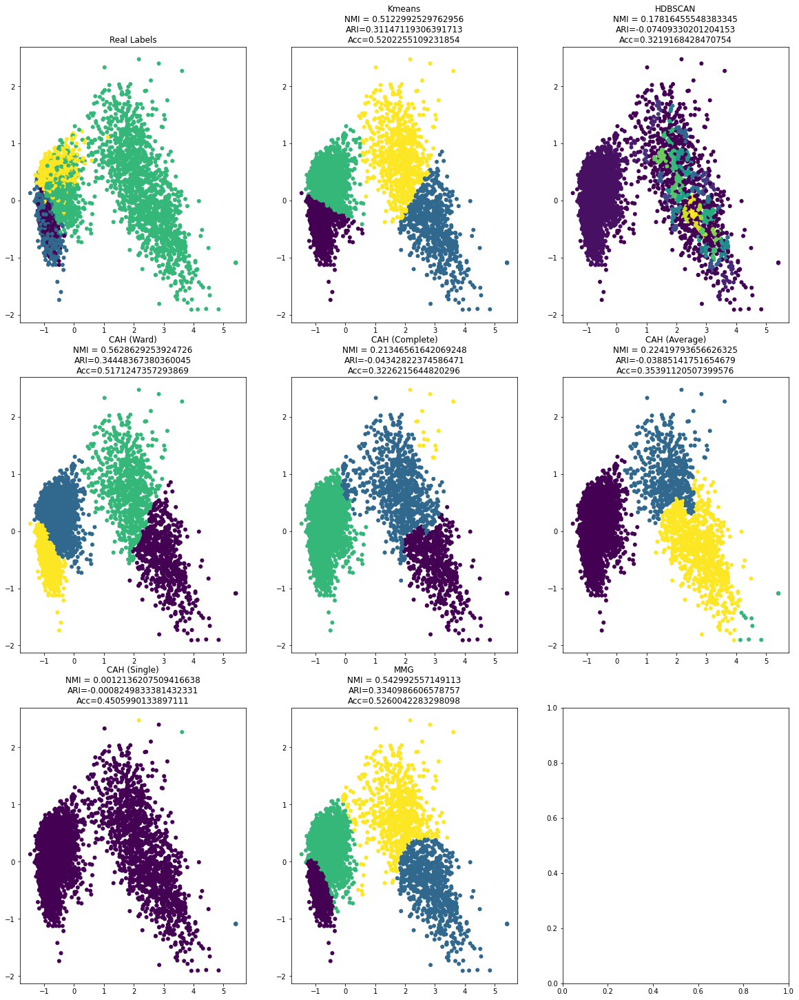

time: 7.61 s (started: 2021-12-05 13:36:17 +00:00)


In [45]:
X_reduced = PCA(n_components=2, random_state=42).fit_transform(classic4_glove)
results_classic4_glove_redim['pca2'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

PCA avec 20 composantes

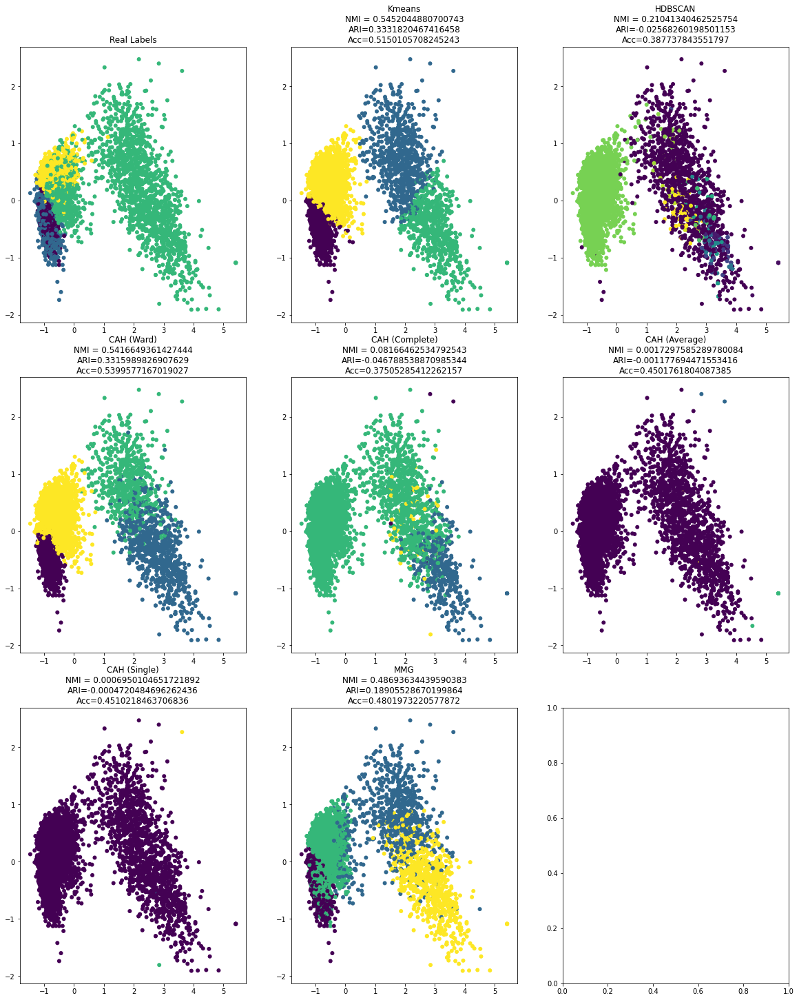

time: 10.2 s (started: 2021-12-05 13:36:25 +00:00)


In [46]:
X_reduced = PCA(n_components=20, random_state=42).fit_transform(classic4_glove)
results_classic4_glove_redim['pca20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- Nous pouvons voir que l'utilisation d'une ACP à 2 ou 20 composantes a dégradé les performances des classifieurs utilisés puisque l'espace dans lequel nous projetons les données n'est pas bon pour séparer les différents classifications.

- Passer de 2 à 20 composantes n'améliore pas la performance des classificateurs.

- Kmeans, CAH(Ward), et MMG sont les seuls a avoir a ARI positif mais faible.

TSNE

/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/studio-lab-user/.conda/envs/default/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


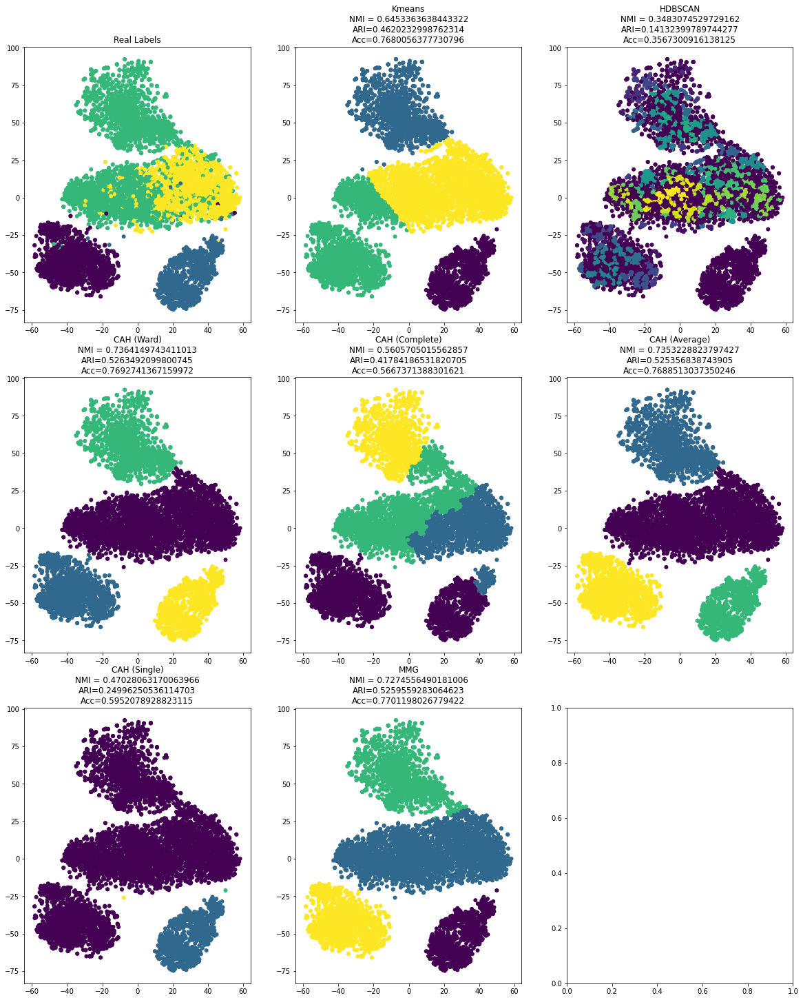

time: 52.3 s (started: 2021-12-05 13:36:35 +00:00)


In [47]:
X_reduced_tsne = TSNE(n_components=2, random_state=42).fit_transform(classic4_glove)
results_classic4_glove_redim['tsne'] = run_clustering(X_reduced_tsne, k_classic4, map_labels(classic4_labels))

- L'espace issu de l'application de tSNE aux données a amélioré de manière significative les performances de tous les modèles.
- La différence de performance entre les projections PCA et tSNE varie entre les différents modèles.
    - L'espace issu de l'application de tSNE aux données a amélioré de manière significative la performance du modèle Kmeans ; nous pouvons voir que le NMI est passé de 0,54 (espace original) à 0,645 et l'ARI de 0.33 à 0,46, ce qui est une valeur acceptable.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle HDBSCAN, mais pas de manière aussi significative que le modèle Kmeans. L'ARI est toujours proche de 0, ce qui signifie que le modèle est toujours comme s'il devinait les étiquettes.
    - Les CAH avec les différentes méthodes de linkage se sont tous améliorés. l'ARI pour ces modèles varie entre 0.24 et 0.52 ce qui est une valeur acceptable, avec un NMI entre 0.47 et 0.73. Le modèle CAH avec lien de la moyenne et ward sont les plus performants des modèles CAH et battent même les résultats obtenus avec Kmeans.
    - L'espace issu de l'application de tSNE aux données a amélioré les performances du modèle MMG qui passe de 0,3 ARI en ACP à 0,52 et de 0,57 NMI à 0,72.

- La précision pour Kmeans, CAH et MMG est la même (77%). Si nous utilisons le NMI pour comparer les modèles, nous pouvons voir que les modèles CAH prennent le dessus sur MMG mais par une petite marge.   

UMAP

In [48]:
X_reduced = UMAP(n_components=2, random_state=42).fit_transform(classic4_glove)

time: 12 s (started: 2021-12-05 13:37:27 +00:00)


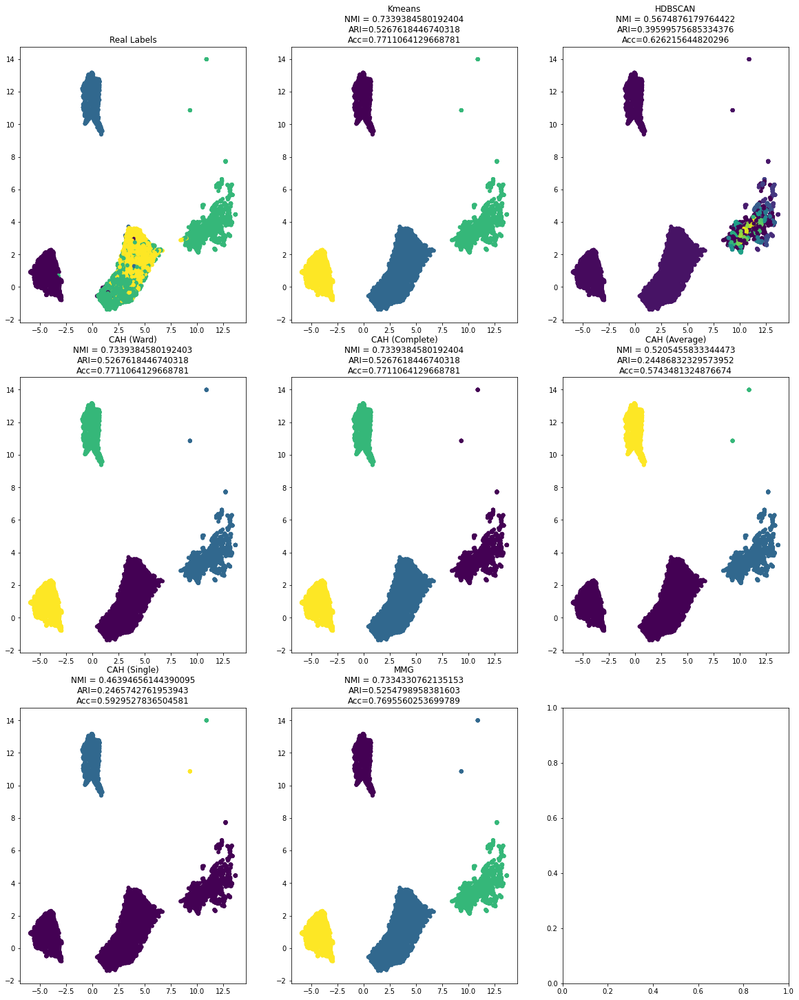

time: 6.15 s (started: 2021-12-05 13:37:39 +00:00)


In [49]:
results_classic4_glove_redim['umap'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

In [50]:
X_reduced = UMAP(n_components=20, random_state=42).fit_transform(classic4_glove)

time: 25 s (started: 2021-12-05 13:37:46 +00:00)


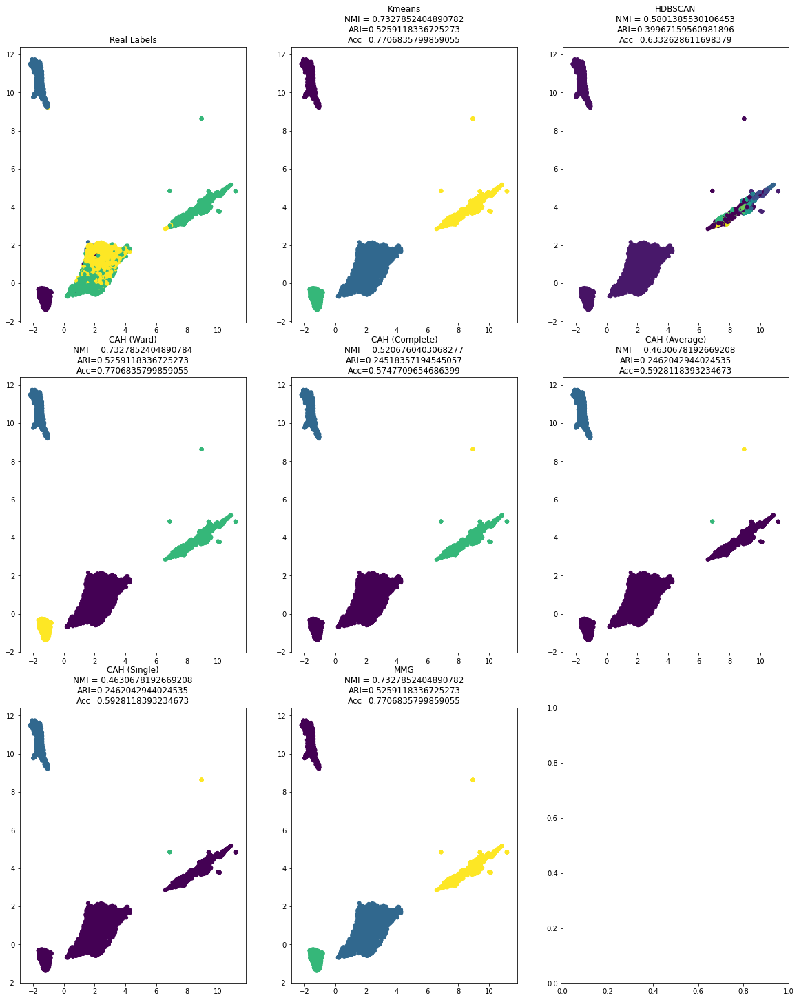

time: 8.03 s (started: 2021-12-05 13:38:11 +00:00)


In [51]:
results_classic4_glove_redim['umap20'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- L'espace issu de l'application de l'UMAP aux données a considérablement amélioré les performances de tous les modèles de l'espace original.

    - Kmeans sous UMAP est meilleur que l'espace original et que tSNE, surtout lorsqu'un nombre plus élevé de composantes est utilisé ; il prend la tête des performances avec le NMI et l'ARI les plus élevés ainsi qu'une précision de 77%.
    - Nous pouvons constater que la méthode de liaison a un impact important sur les performances du modèle CAH. La mesure de distance doit être choisie avec soin en fonction de l'espace des données. Sous 2 composants, le lien maximum est le meilleur CAH, mais sous 20 composants, il est nettement meilleur et ses performances sont très proches de celles de Kmeans.
    - Le modèle MMG est toujours meilleur avec plus d'informations, ce qui explique l'augmentation de la performance entre 2 et 20 composantes, mais cette fois-ci, il a les memes performances que Kmeans et CAH (Ward). 
    - On peut remarquer que les modeles les plus stables en terme de performances a travers les methodes de redim sont le CAH(ward) et le MMG

Autoencoder

In [52]:
n_components=2
X_reduced = autoencoder(classic4_glove.astype("float32"), n_components, seed=42, learning_rate=1e-3)

100%|██████████| 50/50 [00:13<00:00,  3.74it/s]

time: 13.4 s (started: 2021-12-05 13:38:19 +00:00)


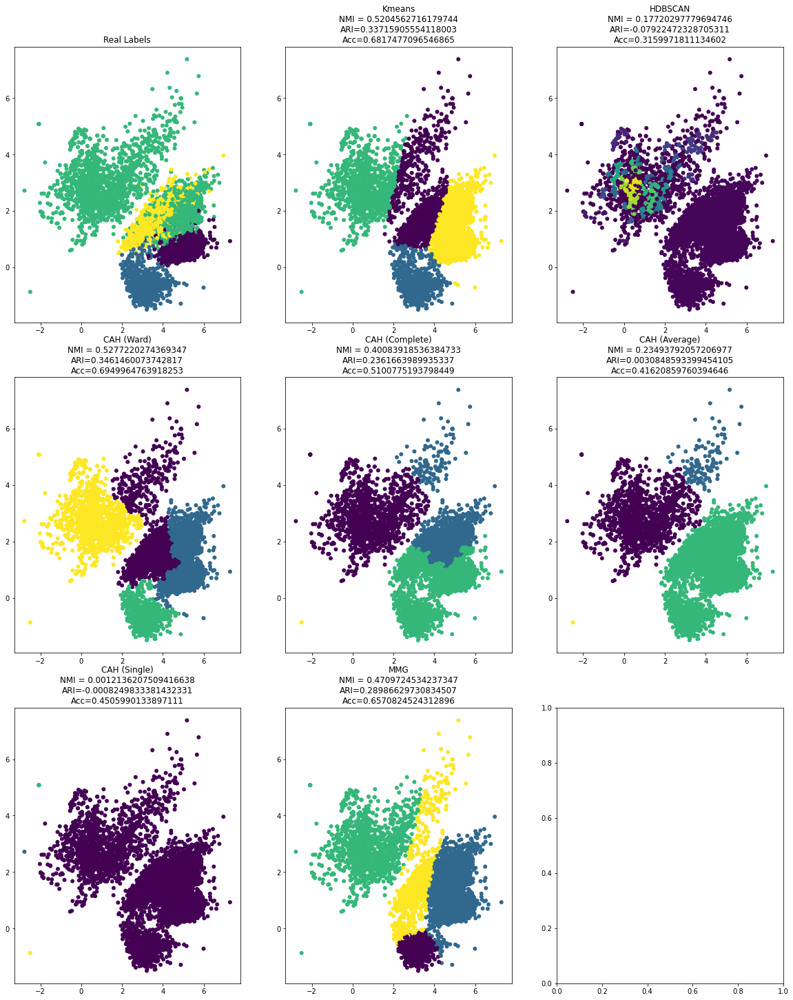

time: 6.35 s (started: 2021-12-05 13:38:32 +00:00)


In [53]:
results_classic4_glove_redim['autoencoder'] = run_clustering(X_reduced, k_classic4, map_labels(classic4_labels))

- D'après les résultats de l'application des différentes méthodes de classification sur l'espace issu de l'autoencodeur, nous pouvons voir :
    - Tous les modèles font mieux que sous l'espace original et l'ACP mais n'atteignent pas leurs performances sous tSNE et UMAP.
    - Kmeans et CAH(Ward) sont les meilleures des modeles avec une NMI de 0.52 et ARI de 0.34 et une precision de 69%

#### Interpretations des resultats 

In [54]:
from copy import deepcopy
results_temp = deepcopy(results_classic4_glove_redim)
for method in results_temp:
    for result in results_temp[method]:
        nmi, ari, acc = results_temp[method][result]
        results_temp[method][result] = {
            'nmi': nmi,
            "ari": ari,
            'acc': acc
        }

time: 1.61 ms (started: 2021-12-05 13:38:38 +00:00)


In [55]:
results_glove_classic4 = pd.DataFrame.from_dict({(i,j): results_temp[i][j] 
                           for i in results_temp.keys() 
                           for j in results_temp[i].keys()},
                       orient='index')

time: 3.05 ms (started: 2021-12-05 13:38:38 +00:00)


Tableau des metriques

In [56]:
results_glove_classic4

nmi       ari       acc
original    Kmeans               0.546820  0.334095  0.515152
            Spectral Clustering  0.152768 -0.106210  0.248203
            HDBSCAN              0.208170 -0.023696  0.390134
            CAH (Ward)           0.579104  0.354563  0.539112
            CAH (Complete)       0.000868 -0.000590  0.450881
            CAH (Average)        0.000695 -0.000472  0.451022
            CAH (Single)         0.000522 -0.000354  0.451163
            MMG                  0.469534  0.171702  0.461029
pca2        Kmeans               0.512299  0.311471  0.520226
            HDBSCAN              0.178165 -0.074093  0.321917
            CAH (Ward)           0.562863  0.344484  0.517125
            CAH (Complete)       0.213466 -0.043428  0.322622
            CAH (Average)        0.224198 -0.038851  0.353911
            CAH (Single)         0.001214 -0.000825  0.450599
            MMG                  0.542993  0.334099  0.526004
pca20       Kmeans               0.545204  0.333182  0.515011
            HDBSCAN              0.210413 -0.025683  0.387738
            CAH (Ward)           0.541665  0.331599  0.539958
            CAH (Complete)       0.081665 -0.046789  0.375053
            CAH (Average)        0.001730 -0.001178  0.450176
            CAH (Single)         0.000695 -0.000472  0.451022
            MMG                  0.486936  0.189055  0.480197
tsne        Kmeans               0.645336  0.462023  0.768006
            HDBSCAN              0.348307  0.141324  0.356730
            CAH (Ward)           0.736415  0.526349  0.769274
            CAH (Complete)       0.560571  0.417842  0.566737
            CAH (Average)        0.735323  0.525357  0.768851
            CAH (Single)         0.470281  0.249963  0.595208
            MMG                  0.727456  0.525956  0.770120
umap        Kmeans               0.733938  0.526762  0.771106
            HDBSCAN              0.567488  0.395996  0.626216
            CAH (Ward)           0.733938  0.526762  0.771106
            CAH (Complete)       0.733938  0.526762  0.771106
            CAH (Average)        0.520546  0.244868  0.574348
            CAH (Single)         0.463947  0.246574  0.592953
            MMG                  0.733433  0.525480  0.769556
umap20      Kmeans               0.732785  0.525912  0.770684
            HDBSCAN              0.580139  0.399672  0.633263
            CAH (Ward)           0.732785  0.525912  0.770684
            CAH (Complete)       0.520676  0.245184  0.574771
            CAH (Average)        0.463068  0.246204  0.592812
            CAH (Single)         0.463068  0.246204  0.592812
            MMG                  0.732785  0.525912  0.770684
autoencoder Kmeans               0.520456  0.337159  0.681748
            HDBSCAN              0.177203 -0.079225  0.315997
            CAH (Ward)           0.527722  0.346146  0.694996
            CAH (Complete)       0.400839  0.236166  0.510078
            CAH (Average)        0.234938  0.003085  0.416209
            CAH (Single)         0.001214 -0.000825  0.450599
            MMG                  0.470972  0.289866  0.657082

time: 10.5 ms (started: 2021-12-05 13:38:38 +00:00)


Les meilleurs methodes selon les 3 metriques

In [64]:
metric = "ari"
results_glove_classic4[results_glove_classic4[metric] == results_glove_classic4[metric].max()]

nmi       ari       acc
umap Kmeans          0.733938  0.526762  0.771106
     CAH (Ward)      0.733938  0.526762  0.771106
     CAH (Complete)  0.733938  0.526762  0.771106

time: 6.78 ms (started: 2021-12-05 13:48:54 +00:00)


In [65]:
metric = "nmi"
results_glove_classic4[results_glove_classic4[metric] == results_glove_classic4[metric].max()]

,,nmi,ari,acc
tsne,CAH (Ward),0.736415,0.526349,0.769274


time: 8.96 ms (started: 2021-12-05 13:48:55 +00:00)


In [66]:
metric = "acc"
results_glove_classic4[results_glove_classic4[metric] == results_glove_classic4[metric].max()]

nmi       ari       acc
umap Kmeans          0.733938  0.526762  0.771106
     CAH (Ward)      0.733938  0.526762  0.771106
     CAH (Complete)  0.733938  0.526762  0.771106

time: 12.5 ms (started: 2021-12-05 13:48:56 +00:00)


Le meilleur model c'est le CAH (Ward) avec UMAP de 2 composantes ou TSNE

In [68]:
X_reduced_best = UMAP(n_components=2, random_state=42).fit_transform(classic4_glove)
best_labels = AgglomerativeClustering(n_clusters=k_classic4).fit_predict(X_reduced_best)

time: 13.7 s (started: 2021-12-05 13:50:58 +00:00)


In [69]:
from wordcloud import WordCloud, STOPWORDS
def print_wordcloud(X, labels):
    temp_df = pd.DataFrame({
        "text": X,
        "labels": labels
    })
    for label in temp_df['labels'].unique():
        alltext = ' '.join(temp_df[temp_df['labels']== label]['text'])
        wordcloud = WordCloud().generate(alltext)
        # Display the generated image:
        print(f'Class: {label}')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        print(f'\n')

time: 857 µs (started: 2021-12-05 13:51:12 +00:00)


Visualization des wordclouds du meilleur clustering

Class: 0


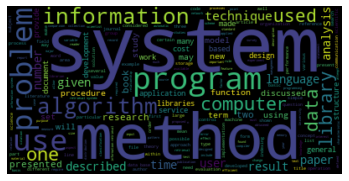



Class: 2


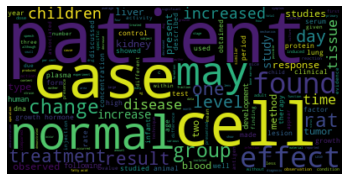



Class: 1


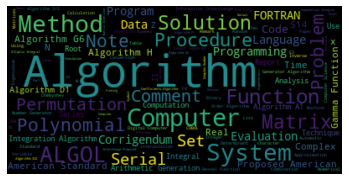



Class: 3


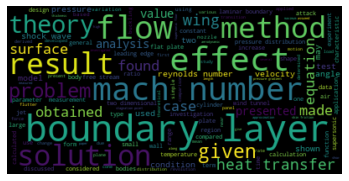



time: 3.92 s (started: 2021-12-05 13:51:12 +00:00)


In [70]:
print_wordcloud(df['text'].values, best_labels)

Class: cacm


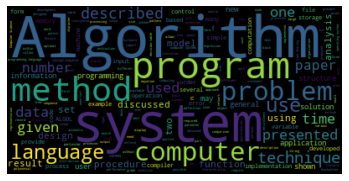



Class: cisi


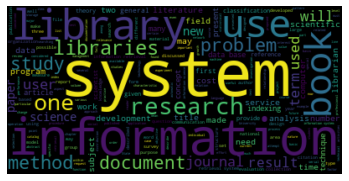



Class: med


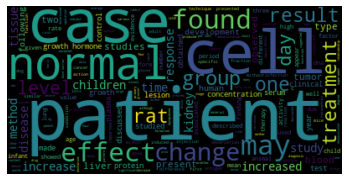



Class: cran


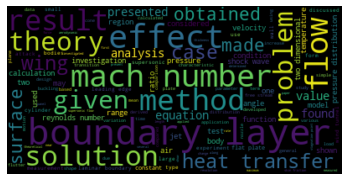



time: 3.91 s (started: 2021-12-05 13:51:16 +00:00)


In [71]:
print_wordcloud(df['text'].values, df['label'].values)

En visualisant les nuages de mots et en les comparant, nous pouvons voir que les classes prédites sont les suivantes :
- La classe 0 est approximativement la classe "cisi" car on peut voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 1 est approximativement la classe "cacm" car nous pouvons voir que ce sont les mêmes termes les plus fréquents dans les deux classes.
- La classe 2 correspond approximativement à la classe "med", car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
- La classe 3 est approximativement la classe "cran" car nous pouvons voir qu'il s'agit des mêmes termes les plus fréquents dans les deux classes.
